This notebook covers a number of the assignments to show progression through exploration of data and the various types of questions.  This should include transformations and visualizations from Week #5 (Secrets) through the beginning of Week #11 (Qualitative).

In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.metrics as sm
import math

<div style="text-align: right">2 Mar 2022</div>
<hr>

# Week 5 Assignment (Tell Me Your Secrets)
## Read Data
Using pandas, read in the forest fires dataset, print the shape (dimensions) of the dataframe, and provide a preview of the rows/columns.

In [2]:
df_orig = pd.read_excel('./data/forest_fires.xlsx')
print(df_orig.shape)
df_orig.head()

(517, 13)


,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,7,5,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.0
1,7,4,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.0
2,7,4,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.0
3,8,6,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.0
4,8,6,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.0


Check columns for null values.

In [3]:
df_orig.isnull().sum()

X        0
Y        0
month    0
day      0
FFMC     0
DMC      0
DC       0
ISI      0
temp     0
RH       0
wind     0
rain     0
area     0
dtype: int64

Look at the types of data in the dataset to understand what format the data within the columns contains.  Pandas does a reasonable job at autocategorizing content when it reads data and attempts to make a best guess at the format of the data.  It is apparent there are some fields in this dataset that would be better represented as numbers to retain the ordinal nature of the field, such as month and day.  However, these variables are currently present as strings.  If the Excel file is opened there is a README with a data dictionary that provides some useful information, which is copied below for posterity.

1. X: x-axis spatial coordinate within the Montesinho park map: 1 to 9
2. Y: y-axis spatial coordinate within the Montesinho park map: 2 to 9
3. month: month of the year: "jan" to "dec"
4. day: day of the week: "mon" to "sun"
5. FFMC: FFMC index from the FWI system: 18.7 to 96.20
6. DMC: DMC index from the FWI system: 1.1 to 291.3
7. DC: DC index from the FWI system: 7.9 to 860.6
8. ISI: ISI index from the FWI system: 0.0 to 56.10
9. temp: temperature in Celsius degrees: 2.2 to 33.30
10. RH: relative humidity in %: 15.0 to 100
11. wind: wind speed in km/h: 0.40 to 9.40
12. rain: outside rain in mm/m2 : 0.0 to 6.4
13. area: the burned area of the forest (in ha): 0.00 to 1090.84 (this output variable is very skewed towards 0.0, thus it may make sense to model with the logarithm transform).

In [4]:
df_orig.dtypes

X          int64
Y          int64
month     object
day       object
FFMC     float64
DMC      float64
DC       float64
ISI      float64
temp     float64
RH         int64
wind     float64
rain     float64
area     float64
dtype: object

Pair plots for numerical values.

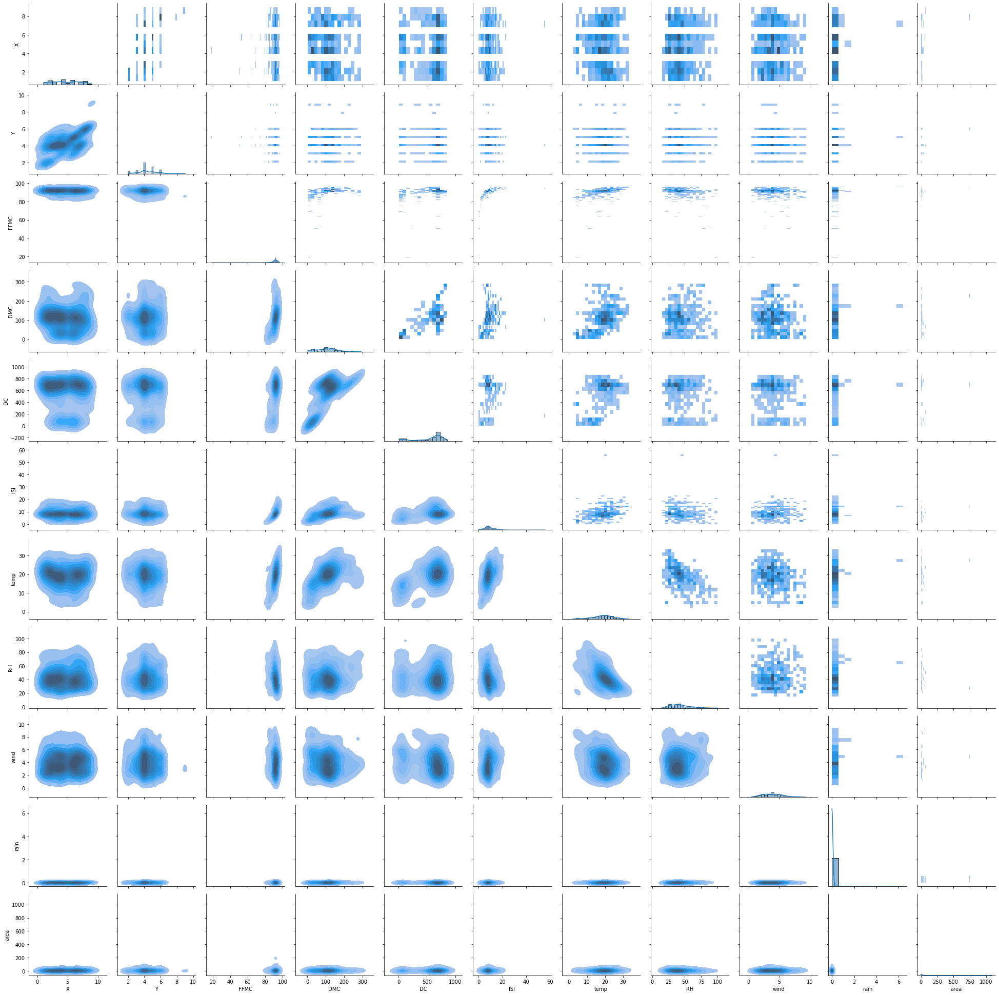

In [5]:
g = sns.PairGrid(df_orig)
g.map_upper(sns.histplot)
g.map_lower(sns.kdeplot,fill=True)
g.map_diag(sns.histplot,kde=True)

Additional research on the acronyms used in the README indicates the following to be the definitions (from [Canadian Wildland Fire Information Systems](https://cwfis.cfs.nrcan.gc.ca/background/summary/fwi)):

- Fine Fuel Moisture Code: The Fine Fuel Moisture Code (FFMC) is a numeric rating of the moisture content of litter and other cured fine fuels. This code is an indicator of the relative ease of ignition and the flammability of fine fuel.
- Duff Moisture Code: The Duff Moisture Code (DMC) is a numeric rating of the average moisture content of loosely compacted organic layers of moderate depth. This code gives an indication of fuel consumption in moderate duff layers and medium-size woody material.
- Drought Code: The Drought Code (DC) is a numeric rating of the average moisture content of deep, compact organic layers. This code is a useful indicator of seasonal drought effects on forest fuels and the amount of smoldering in deep duff layers and large logs.
- Initial Spread Index: The Initial Spread Index (ISI) is a numeric rating of the expected rate of fire spread. It is based on wind speed and FFMC. Like the rest of the FWI system components, ISI does not take fuel type into account. Actual spread rates vary between fuel types at the same ISI.
- Buildup Index: The Buildup Index (BUI) is a numeric rating of the total amount of fuel available for combustion. It is based on the DMC and the DC. The BUI is generally less than twice the DMC value, and moisture in the DMC layer is expected to help prevent burning in material deeper down in the available fuel.
- Fire Weather Index: The Fire Weather Index (FWI) is a numeric rating of fire intensity. It is based on the ISI and the BUI, and is used as a general index of fire danger throughout the forested areas of Canada.

A few observations from this set of pair plots:

- DMC and DC appear to be positively correlated
- ISI and Temperature appear to be positively correlated
- Temperature and Relative Humidity appear to be negatively correlated

## <a id='Transformations'>Transformations</a>

Perform basic transformations of the data.  This would include converting ordinal variables currently encoded as categorical into a numerical representation so that the values can be accurately represented.  The two ordinal values in the dataset are the month and day of the week.  In addition, the recommendation from the README was to transform the *area* variable with a *log* transformation.

This shows the count of the number of month values and that each month is represented, which is then converted to an ordinal.

In [6]:
df = df_orig.copy()

In [7]:
df['month'].value_counts()

aug    184
sep    172
mar     54
jul     32
feb     20
jun     17
oct     15
apr      9
dec      9
jan      2
may      2
nov      1
Name: month, dtype: int64

In [8]:
dict_months = {'jan':1,'feb':2,'mar':3,'apr':4,'may':5,'jun':6,'jul':7,'aug':8,'sep':9,'oct':10,'nov':11,'dec':12}
df['month_ordinal'] = df['month'].map(dict_months)

The months represent a set of values that can be abstracted by coding the values as seasons.  The [National Centers for Environmental Intelligence](https://www.ncei.noaa.gov/news/meteorological-versus-astronomical-seasons) site was used to encode the months into seasons.  Since this park was in Portugal (Montesinho), it is in the Northern Hemisphere and the seasons match the United States.

In [9]:
dict_seasons = {'jan':'Winter','feb':'Winter','mar':'Spring','apr':'Spring','may':'Spring','jun':'Summer','jul':'Summer','aug':'Summer','sep':'Fall','oct':'Fall','nov':'Fall','dec':'Winter'}
df['seasons'] = df['month'].map(dict_seasons)
dict_palette_seasons = {'Summer':'#9b59b6','Fall':'#3498db','Winter':'#95a5a6','Spring':'cyan'}

This shows the count of the number of weekday values and that each weekday is represented, which is then converted to an ordinal value as well as whether the weekday is part of a a weekend or weekday.  In order to keep the days in a reasonable order, Monday was chosen to be the first day of the week, which means Sunday is the last day.  This more naturally allows items to be conceived as weekday versus weekend.

In [10]:
df['day'].value_counts()

sun    95
fri    85
sat    84
mon    74
tue    64
thu    61
wed    54
Name: day, dtype: int64

In [11]:
dict_days = {'sun':6,'mon':0,'tue':1,'wed':2,'thu':3,'fri':4,'sat':5}
df['day_ordinal'] = df['day'].map(dict_days)

In [12]:
dict_days_type = {'sun':'weekend','mon':'weekday','tue':'weekday','wed':'weekday','thu':'weekday','fri':'weekday','sat':'weekend'}
df['day_type'] = df['day'].map(dict_days_type)

The *area* variable contains a number of values that are 0, which would not correctly transform using *log*.  As such, and to preserve the values of data present, the *log* value for *area* was calculated by first adding a trivially small value to avoid  the *divide by zero encountered in log10* error.

In [13]:
df['area_log'] = np.log10(df['area']+0.0000000001)

As of 2 Mar 2022, the method for calculating this value was changed to be a conditional calculation, whereby it would be 0 if the *area* value is 0, otherwise it would return the $log_{10}$ of the *area*.

In [14]:
df['area_log'] = [np.log10(x) if x>0 else 0 for x in df['area']]

Based on some research into DMC and DC, it was determined that the FWI value for buildup index (BUI) can be calculated from the provided values.  This was determined from [Equations and FORTRAN for the Canadian Forest Fire Weather Index System](https://docs.niwa.co.nz/eco/fwsys/ref/EquationsandFORTRANfortheCFFWI.pdf).  As such, the function *get_bui* was developed from this documentation to calculate the buildup index.

<AxesSubplot:xlabel='DC', ylabel='DMC'>

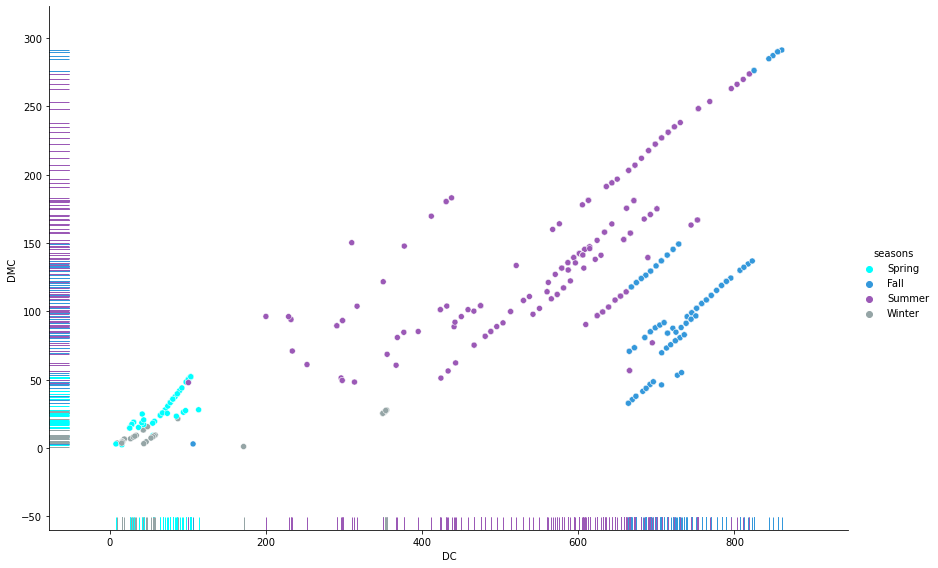

In [15]:
sns.relplot(data=df,x='DC',y='DMC',hue='seasons',height=8,aspect=1.5,palette=dict_palette_seasons)
sns.rugplot(data=df,x='DC',y='DMC',hue='seasons',legend=False,palette=dict_palette_seasons)

In [16]:
def get_bui(val_dmc,val_dc):
    val_rtn = None
    if(val_dmc<=0.4*val_dc):
        val_rtn = 0.8*val_dmc*val_dc/(val_dmc+0.4*val_dc)
    else:
        val_rtn = val_dmc-(1-0.8*val_dc/(val_dmc+0.4*val_dc))*(0.92+(0.0114*val_dmc)**1.7)
    return(val_rtn)

In [17]:
df['BUI'] = df.apply(lambda x: get_bui(val_dmc=x['DMC'],val_dc=x['DC']),axis=1)

## <a id='01DescriptiveStatistics'>Descriptive Statistics</a>

Produce information about the data before visualizing.

In [18]:
vec_columns = df.describe().columns
df.describe()

,X,Y,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,month_ordinal,day_ordinal,area_log,BUI
count,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000
mean,4.669246,4.299807,90.644681,110.872340,547.940039,9.021663,18.889168,44.288201,4.017602,0.021663,12.847292,7.475822,3.259188,0.418422,142.196135
std,2.313778,1.229900,5.520111,64.046482,248.066192,4.559477,5.806625,16.317469,1.791653,0.295959,63.655818,2.275990,2.072929,0.624226,72.354162
min,1.000000,2.000000,18.700000,1.100000,7.900000,0.000000,2.200000,15.000000,0.400000,0.000000,0.000000,1.000000,0.000000,-1.045757,2.165260
25%,3.000000,4.000000,90.200000,68.600000,437.700000,6.500000,15.500000,33.000000,2.700000,0.000000,0.000000,7.000000,1.000000,0.000000,93.489862
50%,4.000000,4.000000,91.600000,108.300000,664.200000,8.400000,19.300000,42.000000,4.000000,0.000000,0.520000,8.000000,4.000000,0.000000,152.650186
75%,7.000000,5.000000,92.900000,142.400000,713.900000,10.800000,22.800000,53.000000,4.900000,0.000000,6.570000,9.000000,5.000000,0.817565,184.530079
max,9.000000,9.000000,96.200000,291.300000,860.600000,56.100000,33.300000,100.000000,9.400000,6.400000,1090.840000,12.000000,6.000000,3.037761,315.565069


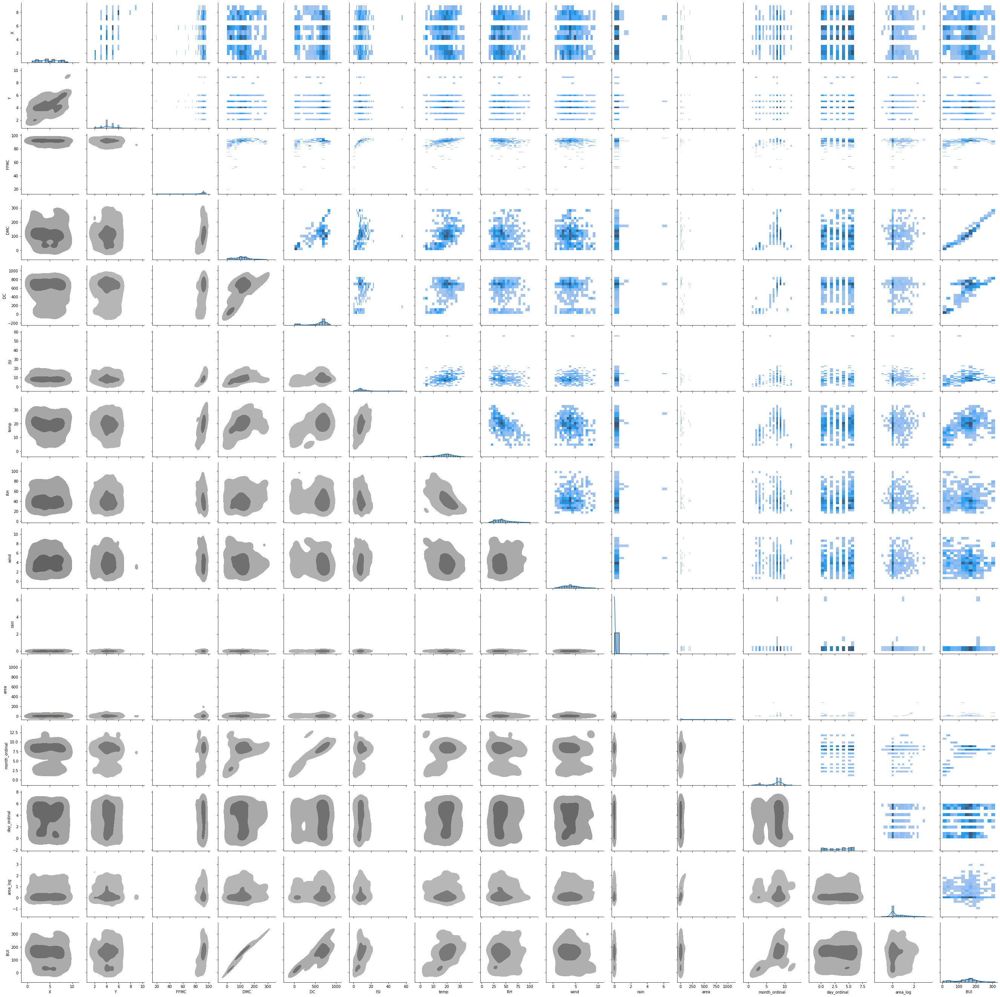

In [19]:
g = sns.PairGrid(df[vec_columns])
g.map_upper(sns.histplot)
g.map_lower(sns.kdeplot,levels=3,color='.2',shade=True,thresh=0.05)
g.map_diag(sns.histplot,kde=True)

<AxesSubplot:>

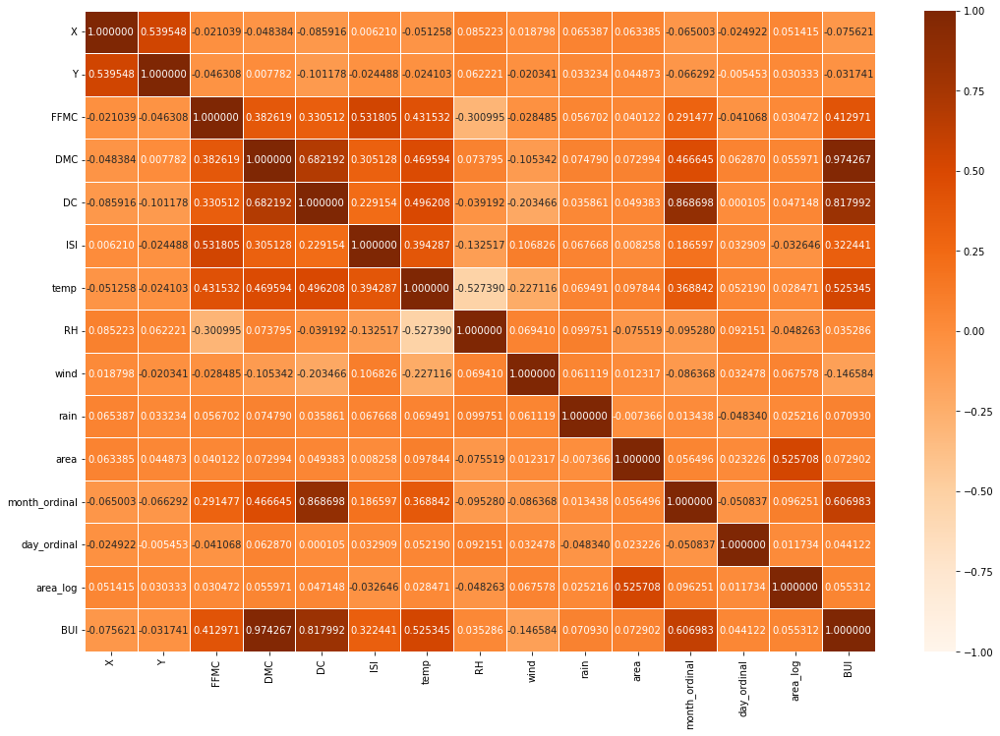

In [20]:
fig,ax = plt.subplots(1,1,figsize=(18,12))
df_corr = df.corr()
sns.heatmap(df_corr,vmin=-1,vmax=1,xticklabels=df_corr.columns,yticklabels=df_corr.columns,cmap='Oranges',annot=True,linewidths=.5,fmt='f',ax=None)

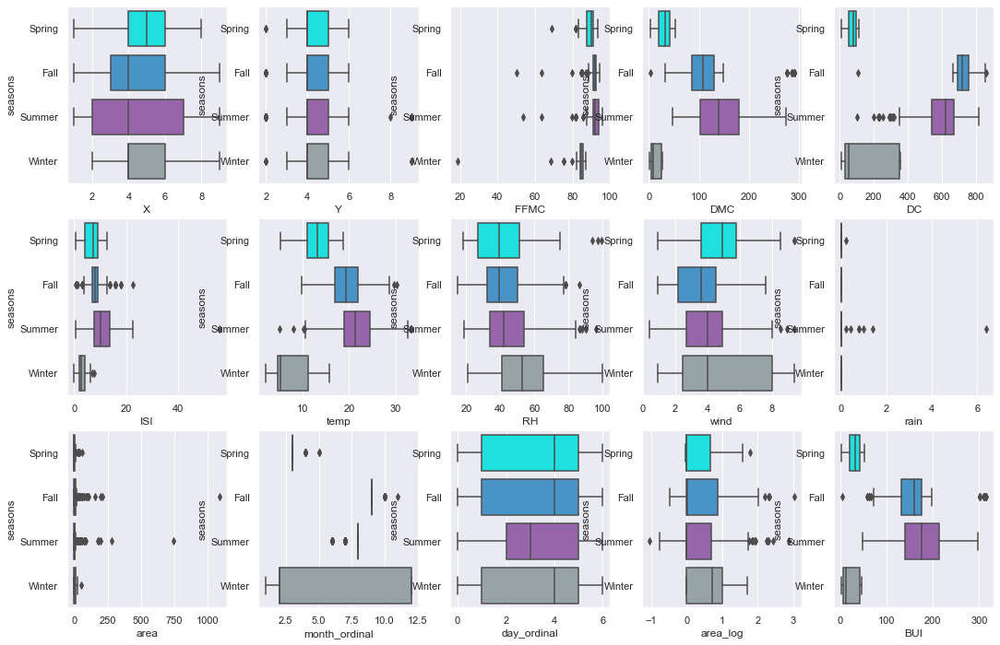

In [21]:
val_num_cols = 3
val_num_rows = math.ceil(len(vec_columns)/val_num_cols)
sns.set()
fig,ax = plt.subplots(val_num_cols,val_num_rows,figsize=(18,12))
for i,val_i in enumerate(range(0,val_num_cols)):
    for j,val_j in enumerate(range(0,val_num_rows)):
        val_index_loc = val_i*val_num_rows+val_j
        if(val_index_loc<len(vec_columns)):
            val_column_name = vec_columns[val_index_loc]
            sns.boxplot(data=df,x=val_column_name,y='seasons',ax=ax[val_i,val_j],palette=dict_palette_seasons)

## Questions
1. How do seasons effect the attributes that contribute to forest firest?
2. Do forest fires occur more or less frequently during weekdays or weekends?
3. Does the wind appear to have any impact on the quantity of area burned?

### <a id='01Question_01'>Question #1</a>:
How do seasons effect the attributes that contribute to forest firest?

In [22]:
val_color_by = 'seasons'

In [23]:
dict_variable_names = {'ffmc':'Fine Fuel Moisture Code (FFMC)',
                       'area_log':'Log Transformation of Forest Fire Area',
                       'bui':'Buildup Index (BUI)',
                       'isi':'Initial Spread Index (ISI)',
                       'dc':'Drought Code (DC)',
                       'dmc':'Duff Moisture Code (DMC)',
                       'day_type':'Type of Weekday',
                       'area':'Forest Fire Area (Hectare)',
                       'x':'Park Location X-Coordinate',
                       'y':'Park Location Y-Coordinate',
                       'rh':'Relative Humidity',
                       'binary_rh_high':'Binary High/Low Relative Humidity (1/0)',
                       'binary_temp_high':'Binary High/Low Temperature (1/0)',
                       'binary_wind_high':'Binary High/Low Winds (1/0)',
                       'binary_rained':'Binary Rain/No Rain (1/0)'}

def get_renamed_variable(str_dataset_col_name,dict_names=dict_variable_names):
    rtn_val = str_dataset_col_name.replace('_',' ').title()
    str_lookup_val = str_dataset_col_name.lower().strip()
    try:
        rtn_val = dict_names[str_lookup_val]
    except:
        pass
    return(rtn_val)

[Text(0.5, 0, 'Month Number'),
 Text(0, 0.5, 'Buildup Index (BUI)'),
 Text(0.5, 1.0, 'Warmer Seasons have Increased Buildup Indices')]

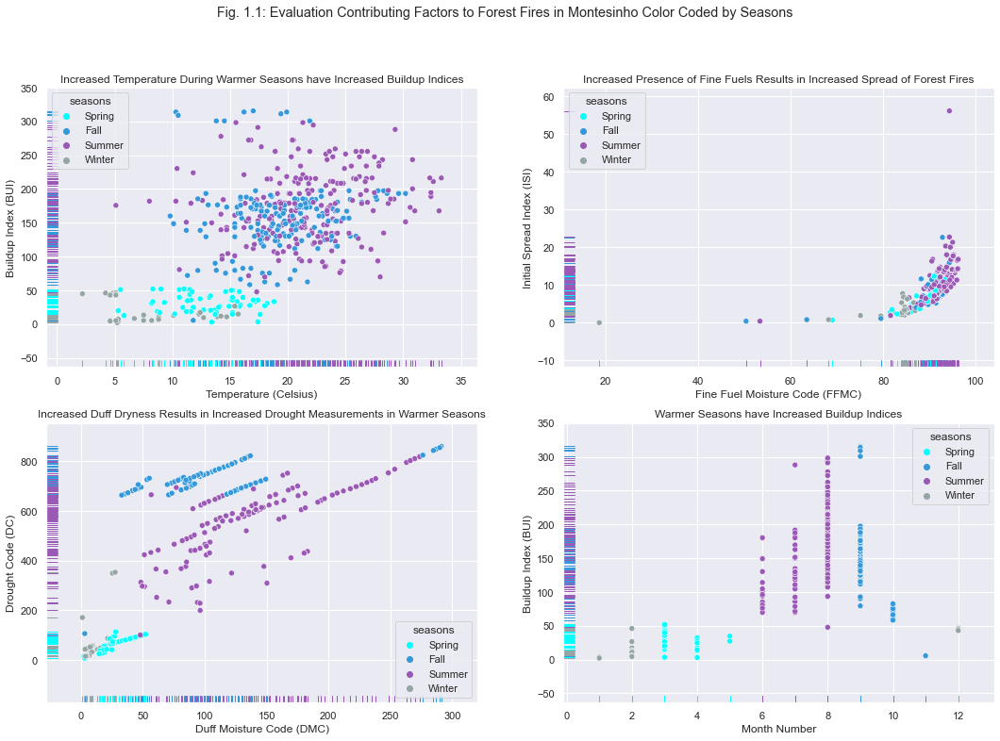

In [24]:
fig,axes = plt.subplots(nrows=2,ncols=2,figsize=(18,12))
plt.suptitle('Fig. 1.1: Evaluation Contributing Factors to Forest Fires in Montesinho Color Coded by {var}'.format(var=get_renamed_variable(val_color_by)))

sns.scatterplot(data=df,x='temp',y='BUI',hue=val_color_by,palette=dict_palette_seasons,ax=axes[0,0])
sns.rugplot(data=df,x='temp',y='BUI',hue=val_color_by,legend=False,palette=dict_palette_seasons,ax=axes[0,0])
axes[0,0].set(xlabel='Temperature (Celsius)',ylabel='Buildup Index (BUI)',title='Increased Temperature During Warmer Seasons have Increased Buildup Indices')

sns.scatterplot(data=df,x='FFMC',y='ISI',hue=val_color_by,palette=dict_palette_seasons,ax=axes[0,1])
sns.rugplot(data=df,x='FFMC',y='ISI',hue=val_color_by,legend=False,palette=dict_palette_seasons,ax=axes[0,1])
axes[0,1].set(xlabel='Fine Fuel Moisture Code (FFMC)',ylabel='Initial Spread Index (ISI)',title='Increased Presence of Fine Fuels Results in Increased Spread of Forest Fires')

sns.scatterplot(data=df,x='DMC',y='DC',hue=val_color_by,palette=dict_palette_seasons,ax=axes[1,0])
sns.rugplot(data=df,x='DMC',y='DC',hue=val_color_by,legend=False,palette=dict_palette_seasons,ax=axes[1,0])
axes[1,0].set(xlabel='Duff Moisture Code (DMC)',ylabel='Drought Code (DC)',title='Increased Duff Dryness Results in Increased Drought Measurements in Warmer Seasons')

sns.scatterplot(data=df,x='month_ordinal',y='BUI',hue=val_color_by,palette=dict_palette_seasons,ax=axes[1,1])
sns.rugplot(data=df,x='month_ordinal',y='BUI',hue=val_color_by,legend=False,palette=dict_palette_seasons,ax=axes[1,1])
axes[1,1].set(xlabel='Month Number',ylabel='Buildup Index (BUI)',title='Warmer Seasons have Increased Buildup Indices')

### <a id='01Question_02'>Question #2</a>:
Do forest fires occur more or less frequently during weekdays or weekends?

In [25]:
df_days = pd.DataFrame(dict_days,index=range(0,1)).transpose().reset_index()
df_days.columns = ['day_name','day_ordinal']
df_types = pd.DataFrame(dict_days_type,index=range(0,1)).transpose().reset_index()
df_types.columns = ['day_name','day_type']
df_days = pd.merge(left=df_days,right=df_types,on='day_name')
dict_palette_days = {row['day_ordinal']: '#95a5a6' if row['day_type']=='weekday' else '#3498db' for i,row in df_days.iterrows()}
dict_palette_day_types = {row['day_type']: '#95a5a6' if row['day_type']=='weekday' else '#3498db' for i,row in df_days.iterrows()}

In [26]:
df_pivot_days = df.pivot_table(index='day_ordinal',values='day',aggfunc=len).reset_index()
df_pivot_days = pd.merge(left=df_pivot_days,right=df_days,on='day_ordinal')
df_pivot_types = df.pivot_table(index='day_type',values='day',aggfunc=len).reset_index()

In [27]:
df_pivot_types['normalized_day'] = 0
for i,row in df_pivot_types.iterrows():
    if(row['day_type']=='weekday'):
        df_pivot_types.loc[i,'normalized_day'] = row['day']/5
    else:
        df_pivot_types.loc[i,'normalized_day'] = row['day']/2

[Text(0.5, 0, 'Type of Weekday'),
 Text(0, 0.5, 'Normalized Number of Forest Fires'),
 Text(0.5, 1.0, 'Normalized Number of Forest by Weekday Type')]

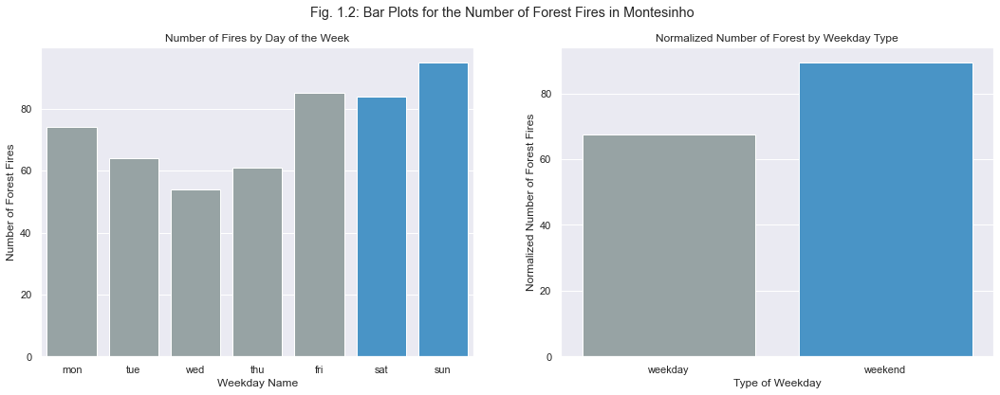

In [28]:
fig,axes = plt.subplots(nrows=1,ncols=2,figsize=(18,6))
plt.suptitle('Fig. 1.2: Bar Plots for the Number of Forest Fires in Montesinho')

sns.barplot(data=df_pivot_days,x='day_ordinal',y='day',palette=dict_palette_days,ax=axes[0])
axes[0].set(xlabel='Weekday Name',ylabel='Number of Forest Fires',title='Number of Fires by Day of the Week')
axes[0].set_xticklabels(df_pivot_days['day_name'].tolist())

sns.barplot(data=df_pivot_types,x='day_type',y='normalized_day',palette=dict_palette_day_types,ax=axes[1])
axes[1].set(xlabel='Type of Weekday',ylabel='Normalized Number of Forest Fires',title='Normalized Number of Forest by Weekday Type')

### <a id='01Question_03'>Question #3</a>:
Does the wind appear to have any impact on the quantity of area burned?

[Text(0.5, 0, 'Wind Speed (km/h)'),
 Text(0, 0.5, 'Drought Code (DC)'),
 Text(0.5, 1.0, 'Wind Speed Compared to Drought Conditions (DC)')]

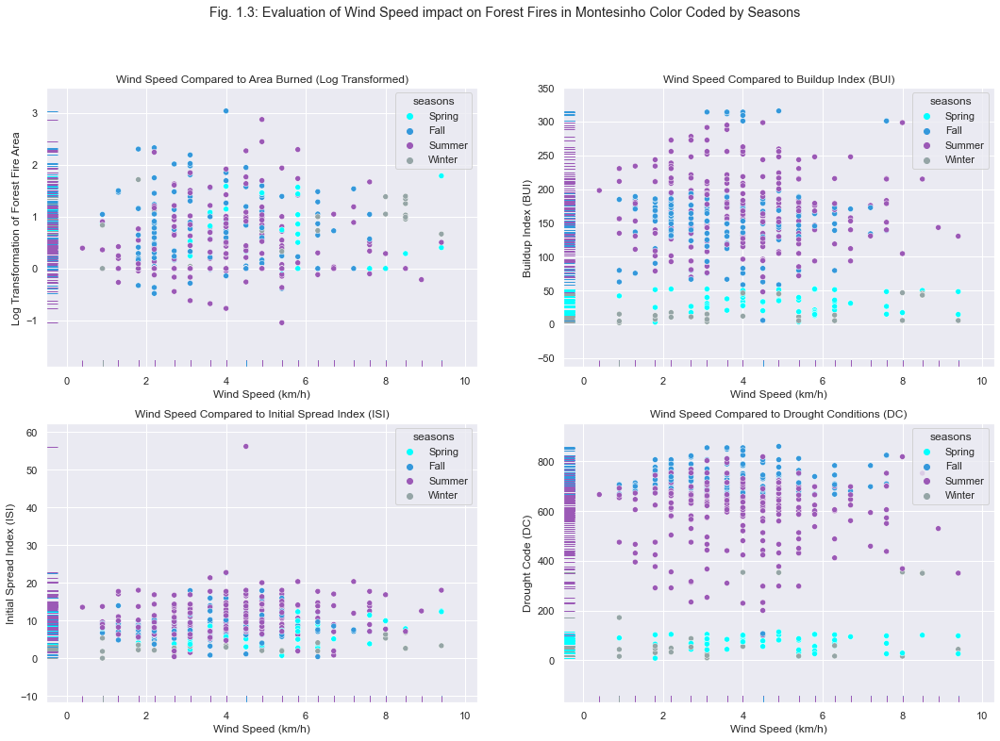

In [29]:
fig,axes = plt.subplots(nrows=2,ncols=2,figsize=(18,12))
plt.suptitle('Fig. 1.3: Evaluation of Wind Speed impact on Forest Fires in Montesinho Color Coded by {var}'.format(var=get_renamed_variable(val_color_by)))

#As of 3 Mar, the calculation method for log(area) was changed to bifurcate when the value of area was 0.
#df_subset = df.loc[df['area_log']>=0].copy()

sns.scatterplot(data=df,x='wind',y='area_log',hue=val_color_by,palette=dict_palette_seasons,ax=axes[0,0])
sns.rugplot(data=df,x='wind',y='area_log',hue=val_color_by,legend=False,palette=dict_palette_seasons,ax=axes[0,0])
axes[0,0].set(xlabel='Wind Speed (km/h)',ylabel='Log Transformation of Forest Fire Area',title='Wind Speed Compared to Area Burned (Log Transformed)')

sns.scatterplot(data=df,x='wind',y='BUI',hue=val_color_by,palette=dict_palette_seasons,ax=axes[0,1])
sns.rugplot(data=df,x='wind',y='BUI',hue=val_color_by,legend=False,palette=dict_palette_seasons,ax=axes[0,1])
axes[0,1].set(xlabel='Wind Speed (km/h)',ylabel='Buildup Index (BUI)',title='Wind Speed Compared to Buildup Index (BUI)')

sns.scatterplot(data=df,x='wind',y='ISI',hue=val_color_by,palette=dict_palette_seasons,ax=axes[1,0])
sns.rugplot(data=df,x='wind',y='ISI',hue=val_color_by,legend=False,palette=dict_palette_seasons,ax=axes[1,0])
axes[1,0].set(xlabel='Wind Speed (km/h)',ylabel='Initial Spread Index (ISI)',title='Wind Speed Compared to Initial Spread Index (ISI)')

sns.scatterplot(data=df,x='wind',y='DC',hue=val_color_by,palette=dict_palette_seasons,ax=axes[1,1])
sns.rugplot(data=df,x='wind',y='DC',hue=val_color_by,legend=False,palette=dict_palette_seasons,ax=axes[1,1])
axes[1,1].set(xlabel='Wind Speed (km/h)',ylabel='Drought Code (DC)',title='Wind Speed Compared to Drought Conditions (DC)')

<div style="text-align: right">4 Mar 2022</div>
<hr>

# Week 6 Assignment (Data Munging is Fun)

Using pandas, read in the forest fires dataset, print the shape (dimensions) of the dataframe, and provide a preview of the rows/columns.  This week's assignment builds on your existing Jupyter Notebook, and will be graded by me. Use what you learn from Data Visualization Made Simple, and the dataset you used for the last assignment to answer the following:
1. How many rows and columns does your data have?
2. What are the different data types in the dataset (e.g., string, Boolean, integer, floating, date/time, categorical, etc.)?
3. What variables would you rename to make your visualization look better?
4. Describe any missing values. Using the rule of thumb in Data Visualization Made Simple, would you remove those rows or columns?
5. What other cleaning / prep steps would you do, based on the advice in Data Visualization Made Simple.

Assignment Task 1: Write the questions above and the answers to them in your Jupyter Notebook in a Markdown cell.

Assignment Task 2: Using the code examples in the Data Visualization Workshop files, perform at least one cleaning step on your data. Use a Markdown cell to describe what you cleaned and how. Use a code cell to write the code that performs the cleaning.

## Task #1:
### Questions
#### <a id='02Question_#1'>Question #1</a>:
How many rows and columns does your data have?

In [30]:
print(df_orig.shape)
print('Rows =',df_orig.shape[0],'\nColumns =',df_orig.shape[1])

(517, 13)
Rows = 517 
Columns = 13


#### <a id='02Question_#2'>Question #2</a>:
What are the different data types in the dataset (e.g., string, Boolean, integer, floating, date/time, categorical, etc.)?

In [31]:
print('Before Transformations:')
print(df_orig.dtypes)

print('\nAfter Transformations:')
print(df.dtypes)

Before Transformations:
X          int64
Y          int64
month     object
day       object
FFMC     float64
DMC      float64
DC       float64
ISI      float64
temp     float64
RH         int64
wind     float64
rain     float64
area     float64
dtype: object

After Transformations:
X                  int64
Y                  int64
month             object
day               object
FFMC             float64
DMC              float64
DC               float64
ISI              float64
temp             float64
RH                 int64
wind             float64
rain             float64
area             float64
month_ordinal      int64
seasons           object
day_ordinal        int64
day_type          object
area_log         float64
BUI              float64
dtype: object


Since a number of transformations were performed in the first assignment, the data types for both the before and after transformations is shown here.  A reasonable outline of the data types is below:

- Spatial:
    - X
    - Y
- Temporal:
    - month
    - day
- Fire Weather Index (FWI):
    - FFMC
    - DMC
    - DC
    - ISI
- Meteorological:
    - temp
    - RH
    - wind
    - rain
- area

#### <a id='02Question_#3'>Question #3</a>:
What variables would you rename to make your visualization look better?

Ultimately, the choice to rename variables is somewhat arbitrary and left to the individual having to build the analysis and visualizations.  Clearly, there are benefits to renaming the variables, especially if anyone is going to read the code for the analysis.  For the purposes of this dataset, most of the variables are in lowercase except for those variables that are acronyms.  The acronyms make it much easier to type and recall the variable names, and having them in uppercase isn't difficult.  For example, FFMC, ISI, DMC, DC, et. al. are entirely in uppercase as they represent acronyms defined by the README.  Ultimately, I decided to leave the variable names as they were in the dataset for two reasons: (1) most of my analysis was built in Assignment #5 and by changing the variable names at this point, I would have produced a number of errors to resolve and (2) based on the issue presented in #1, I prefer to create a dictionary of variable names that could be used, as the name I would represent in a visualization often doesn't work well as a variable name (i.e., it isn't short and easy to fill-in during the analysis stage).  See the example dictionary below for variable names in this dataset as well as a function to perform the mapping with examples.  This dictionary is not complete, but it represents a simple method for achieving the results without changing the variable names.  I have also provided a method to lowercase all of the variables in the dataframe with a single line of Python; this could be used to reassign values to the columns, as shown below in example code.

`df_orig.columns = [str(x).lower().strip() for x in df_orig.columns]`

This technique would match part of the recommendations from Data Visualization Made Simple.  If certain variables were more descriptive, it would improve understanding without having to dig into the README or the data.  For example, the following variables could be renamed:

- *temp* could be *outside_temperature*;
- *RH* could be *relative_humidity*;
- *day* could be *day_of_week*;
- *rain* could be *amount_rainfall*;
- *area* could be *area_burned*;
- *X* could be *park_location_x_coord*; and
- *Y* could be *park_location_y_coord*.

Nonetheless, I retained the original variable names in the dataset.  I opted to improve the readability and understanding of the graphics by setting values for the *x* and *y* axes manually, but utilized the `get_renamed_variables` function to perform this.  As such, this function was migrated to [Section 1, Question 1](#01Question_01) to function as part of the calls for creating visualizations.

In [32]:
print('\n'.join([str(x).lower().strip() for x in df_orig.columns]))

x
y
month
day
ffmc
dmc
dc
isi
temp
rh
wind
rain
area


In [33]:
print('This should return the mapped value for \'BUI\':',get_renamed_variable('BUI'))
print('This should return the mapped value for \'BUI\' (N.B. the space does not impact result):',get_renamed_variable('BUI '))
print('This should return the mapped value for \'dmc\' (N.B. case does not impact result):',get_renamed_variable('dmc'))
print('This should return \'Day\', which is not a variable in the dictionary:',get_renamed_variable('day'))
print('This should return \'Day Name\', which is not a variable in the dictionary:',get_renamed_variable('day_name'))

This should return the mapped value for 'BUI': Buildup Index (BUI)
This should return the mapped value for 'BUI' (N.B. the space does not impact result): Buildup Index (BUI)
This should return the mapped value for 'dmc' (N.B. case does not impact result): Duff Moisture Code (DMC)
This should return 'Day', which is not a variable in the dictionary: Day
This should return 'Day Name', which is not a variable in the dictionary: Day Name


#### <a id='02Question_#4'>Question #4</a>:
Describe any missing values. Using the rule of thumb in Data Visualization Made Simple, would you remove those rows or columns?

In [34]:
print('Number of Missing/Null Values by Variable:')
print(df_orig.isnull().sum())
print('\nTop 5 Values in the Variable \'Area\':')
print(df_orig['area'].value_counts().head())
print('\nPercent Area Values = 0:','{:.2f}%'.format(100*sum(df_orig['area']==0)/df_orig.shape[0]))
print('\n')
print('Area Variable Descriptive Statistics:')
print(df_orig['area'].describe())
print('\n')
print('Area Variable Descriptive Statistics with 0 Values Removed:')
print(df_orig.loc[df_orig['area']>0]['area'].describe())

Number of Missing/Null Values by Variable:
X        0
Y        0
month    0
day      0
FFMC     0
DMC      0
DC       0
ISI      0
temp     0
RH       0
wind     0
rain     0
area     0
dtype: int64

Top 5 Values in the Variable 'Area':
0.00    247
1.94      3
0.52      2
3.71      2
0.68      2
Name: area, dtype: int64

Percent Area Values = 0: 47.78%


Area Variable Descriptive Statistics:
count     517.000000
mean       12.847292
std        63.655818
min         0.000000
25%         0.000000
50%         0.520000
75%         6.570000
max      1090.840000
Name: area, dtype: float64


Area Variable Descriptive Statistics with 0 Values Removed:
count     270.000000
mean       24.600185
std        86.501635
min         0.090000
25%         2.140000
50%         6.370000
75%        15.422500
max      1090.840000
Name: area, dtype: float64


[Text(0.5, 0, 'Forest Fire Area (Hectare)'),
 Text(0.5, 1.0, 'Boxplot of Area with 0 Values Removed')]

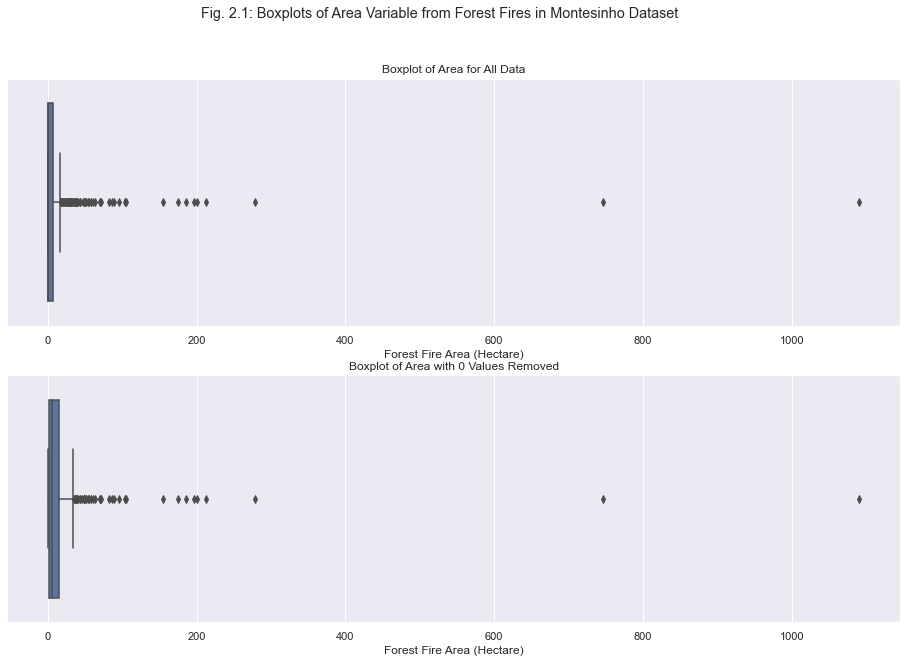

In [35]:
fig,axes = plt.subplots(nrows=2,ncols=1,figsize=(16,10))
plt.suptitle('Fig. 2.1: Boxplots of Area Variable from Forest Fires in Montesinho Dataset')
sns.boxplot(x='area',data=df_orig,ax=axes[0])
axes[0].set(xlabel=get_renamed_variable('area'),title='Boxplot of Area for All Data')
sns.boxplot(x='area',data=df_orig.loc[df_orig['area']>0],ax=axes[1])
axes[1].set(xlabel=get_renamed_variable('area'),title='Boxplot of Area with 0 Values Removed')

[Text(0.5, 0, 'Forest Fire Area (Hectare)'),
 Text(0.5, 1.0, 'Histogram w/Kernel Density Estimate of Area with 0 Values Removed')]

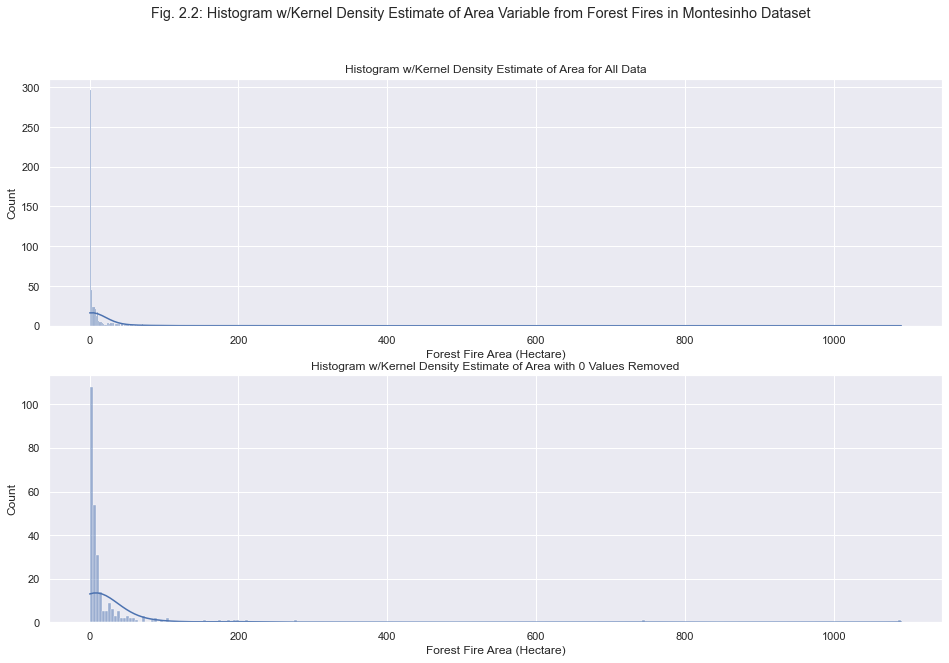

In [36]:
fig,axes = plt.subplots(nrows=2,ncols=1,figsize=(16,10))
plt.suptitle('Fig. 2.2: Histogram w/Kernel Density Estimate of Area Variable from Forest Fires in Montesinho Dataset')
sns.histplot(x='area',data=df_orig,kde=True,ax=axes[0])
axes[0].set(xlabel=get_renamed_variable('area'),title='Histogram w/Kernel Density Estimate of Area for All Data')
sns.histplot(x='area',data=df_orig.loc[df_orig['area']>0],kde=True,ax=axes[1])
axes[1].set(xlabel=get_renamed_variable('area'),title='Histogram w/Kernel Density Estimate of Area with 0 Values Removed')

One of the first checks performed in the first assignment with this dataset was to check if there were any null values.  This was performed with `df_orig.isnull().sum()`.  Using the above check on the dataframe, it was demonstrated that there are no missing or null values amongst the fields in the dataset.  As such, no action is required to fill-in or eliminate missing values.

However, there are some obscure values that should be further evaluated.  In particular, if this is a dataset of forest fires, the field *area* is described as 'the burned area of the forest' but has large concentration of values that are 0.  In fact, of the 517 rows of data 247 of the area values are 0, which is 47.78% of the data.  The boxplots above show the extent of values in this field; Figure 2.1 shows the range for all values in the dataset and the values where `area>0` (i.e., the 0 values are removed).  Figure 2.2 represents these as histograms with a kernel density estimate overlay.  Both of these visualizations show a preponderance of values at or near 0, which would suggest a majority of the forest fires are relatively small.  However, it is concerning that a dataset of forest fires would result in 0 area being burned or destroyed, as it would suggest nearly 50% of the forest fire data resulted in no damage, and this could significantly alter any recommendations that would result from evaluating this dataset as a whole.  Although the number of missing values is below 5%, the number of values in the *area* variable that contain no information is at 47.78%.  As such, before any action is taken, attempts to determine why these values are 0 should be evaluated, as it could reveal if data was not available.  If data was not available when `area==0`, then the mean or median value could be used.  Since the *area* data appears to fairly skewed, the median would likely be a better choice than the mean.

#### <a id='02Question_#5'>Question #5</a>:

What other cleaning / prep steps would you do, based on the advice in Data Visualization Made Simple.

Since a number of the data transformations were performed in the first assignment, it is difficult to outline additional transformations that would be performed here.  However, to summarize the cleaning, preparation, and transformation steps performed in the first assignment in lieu of additional processes, the list below summarizes what was performed in the first assignment.  In addition to these steps, a new variable was built by combining existing variables based on documentation.  This is summarized below.

- *Months to Ordinal*: Convert the named months to their numerical representation so that the ordinal characteristics of this data can be preserved and presented in visualizations.  This will make it easier to present the months in a visualization using a meaningful and understandable representation (i.e., the months are in order).
- *Months to Seasons*: As described in the first assignment, the location where this dataset originated was from Portugal and has the same seasons as the United States.  I suggested that forest fires might be more prevalent during certain seasons when the conditions were more opportune for these events to occur, such as summer and fall.  This is consistent with seasons during which the peak dry periods occur as well as wind is likely to spread fires.  As such, the months can be aggregated into one of four seasons.
- *Days to Ordinal*: Similar to the months variable, converting the named day values into their ordinal representation allows the order to be retained and presented in visualizations.
- *Days to Day Types*: Similar to the aggregation performed on months, the days can be aggregated into the type of day as it relates to the week.  For example, we traditionally treat days of week as being part of the "work week" or "weekend".  Since there are no dates associated with this data, it is difficult to determine if there are special holidays when a fire event started.  However, by taking a conservative approach and labeling the days of the week as either weekday (Mon through Fri) or weekend (Sat and Sun), the data can be aggregated to evaluate if there are more or less fires during one particular period that could be linked to increased human presence.
- *Transformation of Area*: Per the rocommendation from the README, the *area* variable was log transformed.  As previously stated: "The *area* variable contains a number of values that are 0, which would not correctly transform using *log*.  As such, and to preserve the values of data present, the *log* value for *area* was calculated by first adding a trivially small value to avoid  the *divide by zero encountered in log10* error."
- Derivation of Buildup Index (BUI): It was determined that there is variable interaction that could be captured to better indicate the likely buildup of forest fire conditions.  This was described as: "Based on some research into DMC and DC, it was determined that the FWI value for buildup index (BUI) can be calculated from the provided values.  This was determined from [Equations and FORTRAN for the Canadian Forest Fire Weather Index System](https://docs.niwa.co.nz/eco/fwsys/ref/EquationsandFORTRANfortheCFFWI.pdf).  As such, the function *get_bui* was developed from this documentation to calculate the buildup index."

All of the code for these transformations is documented in the [Transformations](#Transformations) cell.

## Task #2:

Using the code examples in the Data Visualization Workshop files, perform at least one cleaning step on your data. Use a Markdown cell to describe what you cleaned and how. Use a code cell to write the code that performs the cleaning.

### <a id='02Task_02.1'>Task #2.1: Previous Assignment Transformations</a>

Please refer to the transformations documented in the [Transformations](#Transformations) or [Section 2, Question #5](#02Question_#5) cells.

### <a id='02Task_02.2'>Task #2.2: Coordinate Transformations</a>

The code below provides three visualizations of the forest fire data while demonstrating aspects of data cleaning from the Data Visualization Workshop.  The methods below demonstrate sorting and reshaping the data to produce visualizations.  The visualizations below take advantage of the *X* and *Y* values in the data, which are essentially coordinates within the Montesinho Park and can be treated as spatial data.  The README describes these two variables as "spatial coordinate within the Montesinho park map".  Using the other variables, we can transform the data to produce visualizations of the content that could be visualized similar to a map, but in the form of a heatmap.  This would provide a perspective of the intensity of a measure for the grid coordinates.  In order to make the heatmap, the first step is to transform the dataset by aggregating the values along the *X* and *Y* values.  Then the resulting pivot table needs to be properly sorted, so that visualization accurately projects information consistent with expectations (i.e. the *y-coordinate* should increase in the upwards direction; the *x-coordinate* should increase moving right).  The following visualizations were produced using these techniques:

1. In the case of understanding the number of forest fires, a first step was to count the number of forest firest in each grid square.  This provides some understanding of the number of forest fires in certain areas of the park.
2. The *log* of the *area* can be used to represent the average area burned.
3. The BUI value can be used to represent the average BUI.

(7, 9)


[Text(0.5, 66.5, 'Park Location X-Coordinate'),
 Text(120.5, 0.5, 'Park Location Y-Coordinate'),
 Text(0.5, 1.0, 'Fig. 2.3: Heatmap of the Number of Forest Fires in Montesinho Park Grid')]

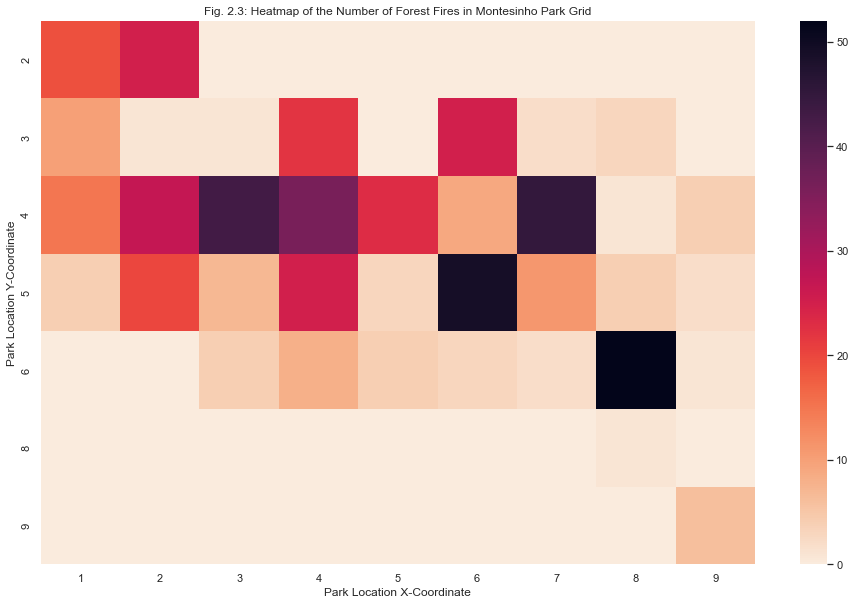

In [37]:
df_pivot_coords = df.pivot_table(index='Y',columns='X',values='BUI',aggfunc=len,fill_value=0)
print(df_pivot_coords.shape)
df_pivot_coords.sort_index(axis=0,ascending=True,inplace=True)
df_pivot_coords.sort_index(axis=1,ascending=True,inplace=True)

fig,axes = plt.subplots(figsize=(16,10))
sns.heatmap(data=df_pivot_coords,vmin=0,cmap=sns.color_palette("rocket_r", as_cmap=True),ax=axes)
axes.set(xlabel=get_renamed_variable('X'),ylabel=get_renamed_variable('Y'),title='Fig. 2.3: Heatmap of the Number of Forest Fires in Montesinho Park Grid')

(7, 9)


[Text(0.5, 66.5, 'Park Location X-Coordinate'),
 Text(120.5, 0.5, 'Park Location Y-Coordinate'),
 Text(0.5, 1.0, 'Fig. 2.4: Heatmap of the Average Area (Log Transformed) Destroyed for Forest Fires in Montesinho Park Grid')]

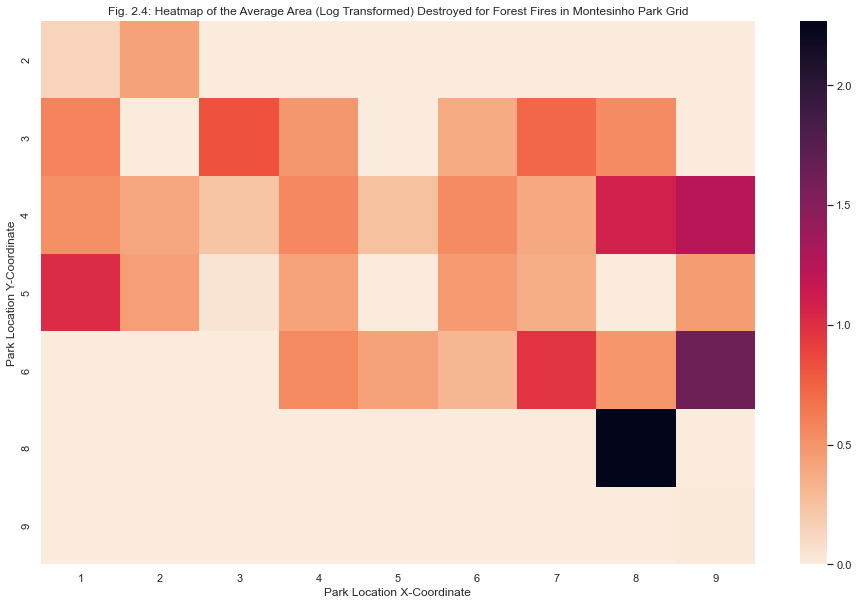

In [38]:
df_pivot_area = df.pivot_table(index='Y',columns='X',values='area_log',aggfunc=pd.Series.mean,fill_value=0)
print(df_pivot_area.shape)
df_pivot_area.sort_index(axis=0,ascending=True,inplace=True)
df_pivot_area.sort_index(axis=1,ascending=True,inplace=True)

fig,axes = plt.subplots(figsize=(16,10))
sns.heatmap(data=df_pivot_area,vmin=0,cmap=sns.color_palette("rocket_r", as_cmap=True),ax=axes)
axes.set(xlabel=get_renamed_variable('X'),ylabel=get_renamed_variable('Y'),title='Fig. 2.4: Heatmap of the Average Area (Log Transformed) Destroyed for Forest Fires in Montesinho Park Grid')

(7, 9)


[Text(0.5, 66.5, 'Park Location X-Coordinate'),
 Text(120.5, 0.5, 'Park Location Y-Coordinate'),
 Text(0.5, 1.0, 'Fig. 2.5: Heatmap of the Average Buildup Index (BUI) for Forest Fires in Montesinho Park Grid')]

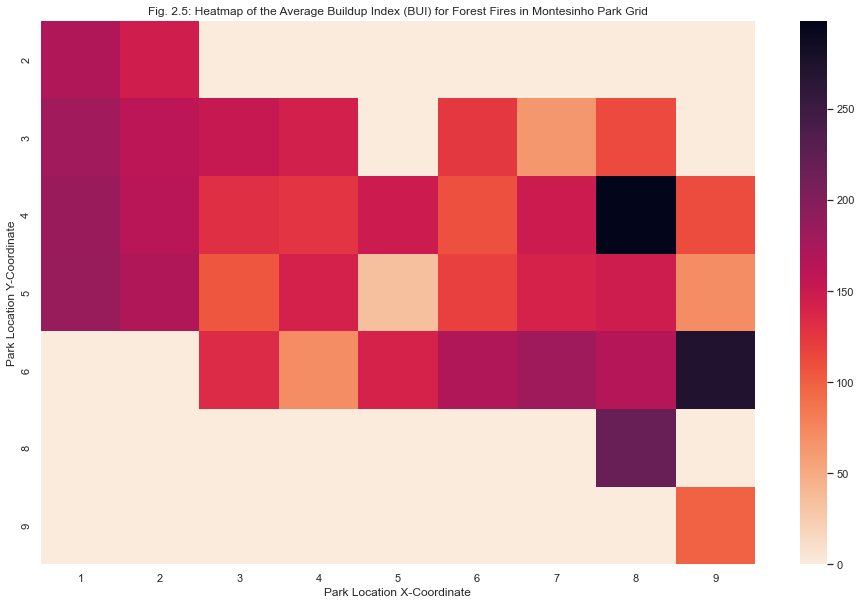

In [39]:
df_pivot_bui = df.pivot_table(index='Y',columns='X',values='BUI',aggfunc=pd.Series.mean,fill_value=0)
print(df_pivot_bui.shape)
df_pivot_bui.sort_index(axis=0,ascending=True,inplace=True)
df_pivot_bui.sort_index(axis=1,ascending=True,inplace=True)

fig,axes = plt.subplots(figsize=(16,10))
sns.heatmap(data=df_pivot_bui,vmin=0,cmap=sns.color_palette("rocket_r", as_cmap=True),ax=axes)
axes.set(xlabel=get_renamed_variable('X'),ylabel=get_renamed_variable('Y'),title='Fig. 2.5: Heatmap of the Average Buildup Index (BUI) for Forest Fires in Montesinho Park Grid')

### <a id='02Task_02.3'>Task #2.3: Recoding Variables</a>

As part of the evaluation of the data, it has come to my attention that certain continuous fields are interesting as continuous number values, but the question really being asked might be whether something did or did not occur.  For example, did it rain on the date of the fire or was there no rain?  Similarly, was the wind speed high or relatively normal on the day of the fire?  Finally, was the temperature abnormally high or within normal range on the day of the fire?  In order to address these binary questions, some additional insight was developed on each of the variables where these questions were being asked.  In particular: rain, temperature, wind, and relative humidity.  For temperature, wind, and relatively humidity the question centered on whether the value for that day was higher than "normal".  For this circumstance, "higher than normal" was considered to be any value at or above the third quartile (75%) of the data.  Thus, for the questions focused on whether the value was high, if the value was at or above the third quartile the value was recoded as a 1, otherwise it was 0.  The question about rain was whether any existed or not, as such if the value of rain was above 0 it was marked with a 1, otherwise it was 0.  The code below provides exploratory data analysis (EDA) as well as the transformation and re-projection of Figure 1.1 (see [Section 1, Question 1](#01Question_01)).

- `val_name` indicates which variable to show exploratory visualizations for in Figure 2.6.  The options are, for the purpose of this transformation would be (although any variable in the dataframe could be substituted):
    - `rain`
    - `RH`
    - `temp`
    - `wind`
- `val_color_by` controls which recoded binary variable to color the visualizations by in Figure 2.7.  The options are:
    - `binary_rained`
    - `binary_rh_high`
    - `binary_temp_high`
    - `binary_wind_high`

In [40]:
val_name = 'RH'
val_color_by = 'binary_rh_high'

27    33
39    24
35    20
43    17
42    17
Name: RH, dtype: int64


count    517.000000
mean      44.288201
std       16.317469
min       15.000000
25%       33.000000
50%       42.000000
75%       53.000000
max      100.000000
Name: RH, dtype: float64




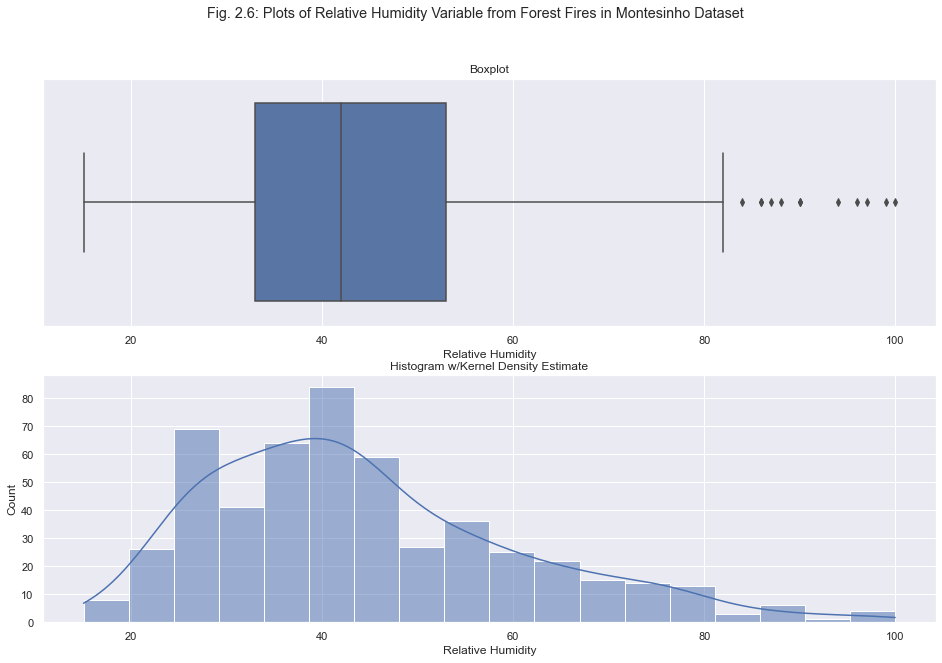

In [41]:
fig,axes = plt.subplots(nrows=2,ncols=1,figsize=(16,10))
plt.suptitle('Fig. 2.6: Plots of {var} Variable from Forest Fires in Montesinho Dataset'.format(var=get_renamed_variable(val_name)))
sns.boxplot(x=val_name,data=df,ax=axes[0])
axes[0].set(xlabel=get_renamed_variable(val_name),title='Boxplot')
sns.histplot(x=val_name,data=df,kde=True,ax=axes[1])
axes[1].set(xlabel=get_renamed_variable(val_name),title='Histogram w/Kernel Density Estimate')
print(df[val_name].value_counts().head())
print('\n')
print(df[val_name].describe())
print('\n')

The cells below perform the transformation of the data to create the four new, derived, recoded variables from the original data.  The subsequent cells produce the visualizations.

In [42]:
df['binary_rained'] = [0 if x<=0 else 1 for x in df_orig['rain']]
df['binary_temp_high'] = [0 if x<=df['temp'].quantile(0.75) else 1 for x in df['temp']]
df['binary_wind_high'] = [0 if x<=df['wind'].quantile(0.75) else 1 for x in df['wind']]
df['binary_rh_high'] = [0 if x<=df['RH'].quantile(0.75) else 1 for x in df['RH']]

In [43]:
#Setup a color palette for the binary encoding...
dict_palette_binary = {0:'#95a5a6',1:'#3498db'}

[Text(0.5, 0, 'Month Number'),
 Text(0, 0.5, 'Buildup Index (BUI)'),
 Text(0.5, 1.0, 'Warmer Seasons have Increased Buildup Indices')]

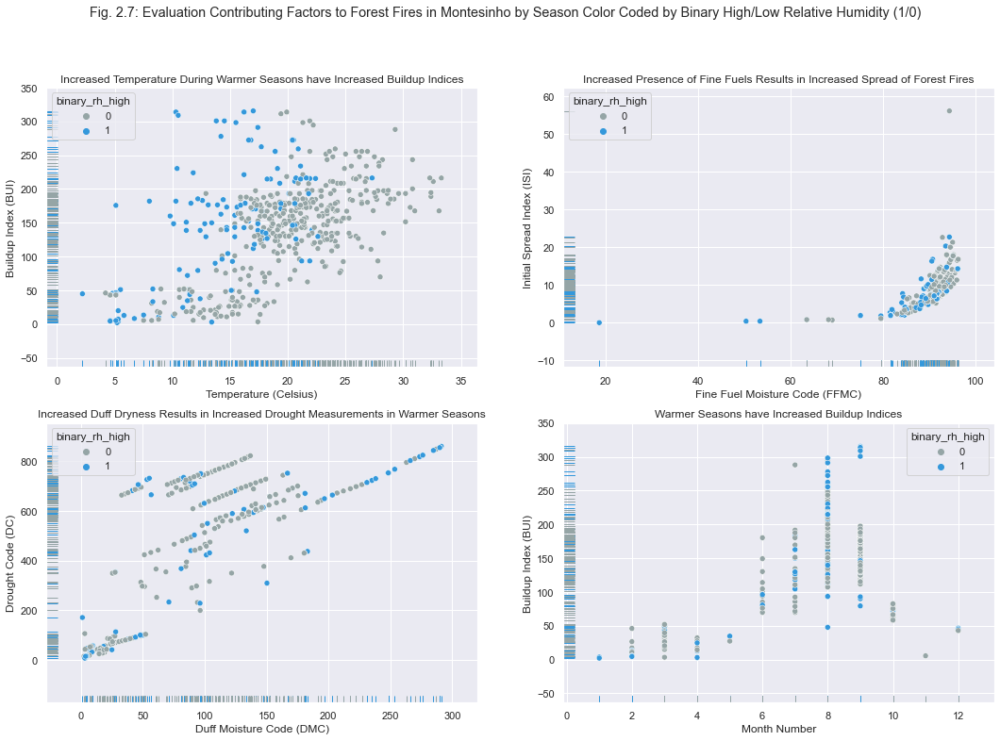

In [44]:
fig,axes = plt.subplots(nrows=2,ncols=2,figsize=(18,12))
plt.suptitle('Fig. 2.7: Evaluation Contributing Factors to Forest Fires in Montesinho by Season Color Coded by {var}'.format(var=get_renamed_variable(val_color_by)))

sns.scatterplot(data=df,x='temp',y='BUI',hue=val_color_by,palette=dict_palette_binary,ax=axes[0,0])
sns.rugplot(data=df,x='temp',y='BUI',hue=val_color_by,legend=False,palette=dict_palette_binary,ax=axes[0,0])
axes[0,0].set(xlabel='Temperature (Celsius)',ylabel='Buildup Index (BUI)',title='Increased Temperature During Warmer Seasons have Increased Buildup Indices')

sns.scatterplot(data=df,x='FFMC',y='ISI',hue=val_color_by,palette=dict_palette_binary,ax=axes[0,1])
sns.rugplot(data=df,x='FFMC',y='ISI',hue=val_color_by,legend=False,palette=dict_palette_binary,ax=axes[0,1])
axes[0,1].set(xlabel='Fine Fuel Moisture Code (FFMC)',ylabel='Initial Spread Index (ISI)',title='Increased Presence of Fine Fuels Results in Increased Spread of Forest Fires')

sns.scatterplot(data=df,x='DMC',y='DC',hue=val_color_by,palette=dict_palette_binary,ax=axes[1,0])
sns.rugplot(data=df,x='DMC',y='DC',hue=val_color_by,legend=False,palette=dict_palette_binary,ax=axes[1,0])
axes[1,0].set(xlabel='Duff Moisture Code (DMC)',ylabel='Drought Code (DC)',title='Increased Duff Dryness Results in Increased Drought Measurements in Warmer Seasons')

sns.scatterplot(data=df,x='month_ordinal',y='BUI',hue=val_color_by,palette=dict_palette_binary,ax=axes[1,1])
sns.rugplot(data=df,x='month_ordinal',y='BUI',hue=val_color_by,legend=False,palette=dict_palette_binary,ax=axes[1,1])
axes[1,1].set(xlabel='Month Number',ylabel='Buildup Index (BUI)',title='Warmer Seasons have Increased Buildup Indices')

<div style="text-align: right">25 Mar 2022</div>
<hr>

# Week 8 Assignment (Visualizing Correlation, Comparisons, and Trends)

Use the dataset and Jupyter Notebook you've been using. 
- Task 1: Develop one question related to correlation, comparison or trends for this dataset. Write the question in a Markdown cell in your notebook.
- Task 2: Develop a graphic appropriate to this type of question, that answers the question. Use a code cell in your notebook.
- Task 3: Write your interpretation of the graph (100 to 500 words), including how it answers the question.
- Task 4: DO NOT SUBMIT YOUR NOTEBOOK FOR THIS. Hover over the graphic in your notebook and you'll see a tiny save icon. Click on that and save the graphic as an image. Upload the image, write your question and answer in the assignment submission box, and submit everything.

## Task #1: Develop a Question

For this effort, the underlying dataset provides point observations for the occurrence of fires in Montesinho Natural Park (Portugal).  Since there are no observations for when fires do not occur, it is not possible to determine how strong a variable, set of variables, or transformation would be able to predict the conditions of a fire.  As such, correlation to the outcome is not possible.  However, it is possible to compare varaibles within the data to determine how well they correlate or correspond to each other.

In section [Section 1, Descriptive Statistics](#01DescriptiveStatistics) a heatmap of correlations for the variables was produced and in [Section 2, Task 2.2](#02Task_02.2) three correspondence analysis plots were produced.  Although those helped produce descriptive information the data, for this section, those inputs will be used to develop a singular question about correlation.  In particular, the correlation values for the variables will be recalculated to include the transformed values.  This is performed below, wherein the upper triangle of the correlation matrix is used, excluding the diagonal, to identify the most highly correlated values from the set of variables.  Since there are 19 variables in the revised dataframe, this produces a total of 171 correlation values (i.e., `0.5*(19*19-19)`).  By taking the absolute value of the correlation, the set can be sorted to identify the values with the highest correlations.  The top seven (7) values results in the following set of variables:

- `BUI` and `DMC`: The variable `BUI` is derived from the `DMC` variable, and as such it makes sense to be highly correlated.  Given this relationship, it does not make sense to develop any insight between these two variables.  See the [Section 1, Transformations](#Transformations) section for a description of the transformations.
- `month_ordinal` and `DC`:
- `BUI` and `DC`: The variable `BUI` is derived from the `DC` variable, and as such it makes sense to be highly correlated.  Given this relationship, it does not make sense to develop any insight between these two variables.  See the [Section 1, Transformations](#Transformations) section for a description of the transformations.
- `binary_rh_high` and `RH`: The variable `binary_rh_high` is derived from the `RH` variable, and as such it makes sense to be highly correlated.  Given this relationship, it does not make sense to develop any insight between these two variables.  See [Section 2, Task 2.3](#02Task_02.3) for a description of the transformations.
- `binary_wind_high` and `wind`: The variable `binary_wind_high` is derived from the `wind` variable, and as such it makes sense to be highly correlated.  Given this relationship, it does not make sense to develop any insight between these two variables.  See [Section 2, Task 2.3](#02Task_02.3) for a description of the transformations.
- `binary_temp_high` and `temp`: The variable `binary_temp_high` is derived from the `temp` variable, and as such it makes sense to be highly correlated.  Given this relationship, it does not make sense to develop any insight between these two variables.  See [Section 2, Task 2.3](#02Task_02.3) for a description of the transformations.
- `DC` and `DMC`: These two variables reprsent variables that were part of the original dataset; both are derived from the FWI system and represent continuous variables.  `DC` is the drought code and according to the [National Wildfire Coordinating Group](https://www.nwcg.gov/publications/pms437/cffdrs/fire-weather-index-system) it "represents drying deep into the soil. It approximates moisture conditions for the equivalent of 53-day (1272 hour) timelag fuels. It is unitless, with a maximum value of 1000".  `DMC` is the Duff moisture code and according to the [National Wildfire Coordinating Group](https://www.nwcg.gov/publications/pms437/cffdrs/fire-weather-index-system) it "represents fuel moisture of decomposed organic material underneath the litter. System designers suggest that it is represents moisture conditions for the equivalent of 15-day (or 360 hr) timelag fuels. It is unitless and open ended. It may provide insight to live fuel moisture stress".  In addition, both of these variables are used to build the `BUI` value.  A chart showing the relationship for these two values was shown in [Section 1, Transformations](#Transformations) and was color encoded by the transformed value for season.

Based on these values, the question being addressed stems from looking at the correlation between `DC` and `DMC` for each season.  The overall correlation between `DC` and `DMC` is 0.6822, but the graph, as in Figure 3.1, appears to have stratified levels for seasons.  As such, if the values for `DC` and `DMC` are broken out by season *can the correlation between DC and DMC be improved by including seasonal information?*

**QUESTION:**
Can the correlation between DC and DMC be improved by including seasonal information?

In [45]:
df_corr_rev = df.corr()
print(df_corr_rev.shape)
df_corr_unstacked = pd.DataFrame(np.triu(df_corr_rev,k=1),index=df_corr_rev.index,columns=df_corr_rev.columns).unstack()
df_corr_unstacked_rev = pd.DataFrame(data=df_corr_unstacked).reset_index()
df_corr_unstacked_rev.columns = ['var_1','var_2','corr']
df_corr_unstacked_rev = df_corr_unstacked_rev.loc[(df_corr_unstacked_rev['corr']!=0)].copy()
df_corr_unstacked_rev['corr_abs'] = df_corr_unstacked_rev['corr'].abs()
df_corr_unstacked_rev.sort_values(by='corr_abs',ascending=False,inplace=True)
df_corr_unstacked_rev.head(7)

(19, 19)


,var_1,var_2,corr,corr_abs
269,BUI,DMC,0.974267,0.974267
213,month_ordinal,DC,0.868698,0.868698
270,BUI,DC,0.817992,0.817992
349,binary_rh_high,RH,0.816508,0.816508
331,binary_wind_high,wind,0.774520,0.774520
310,binary_temp_high,temp,0.692914,0.692914
79,DC,DMC,0.682192,0.682192


[Text(0.5, 0, 'Drought Code (DC)'),
 Text(0, 0.5, 'Duff Moisture Code (DMC)'),
 Text(0.5, 1.0, 'Fig. 3.1: Plot of Drought Code (DC) and Duff Moisture Code (DMC) Color Coded by Seasons from Forest Fires in Montesinho Dataset')]

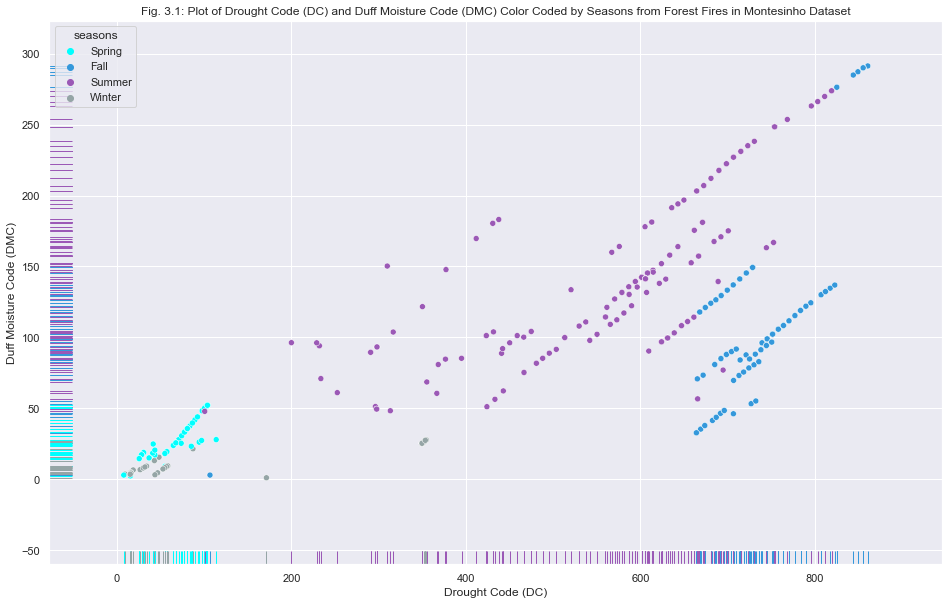

In [46]:
fig,axes = plt.subplots(nrows=1,ncols=1,figsize=(16,10))
var_x_3 = 'DC'
var_y_3 = 'DMC'
val_color_by = 'seasons'
sns.scatterplot(data=df,x=var_x_3,y=var_y_3,hue=val_color_by,palette=dict_palette_seasons)
sns.rugplot(data=df,x=var_x_3,y=var_y_3,hue=val_color_by,legend=False,palette=dict_palette_seasons,ax=axes)
axes.set(xlabel=get_renamed_variable(var_x_3),ylabel=get_renamed_variable(var_y_3),
         title='Fig. 3.1: Plot of {var_1} and {var_2} Color Coded by {var_3} from Forest Fires in Montesinho Dataset'.format(var_1=get_renamed_variable(var_x_3),
                                                                                                                             var_2=get_renamed_variable(var_y_3),
                                                                                                                             var_3=get_renamed_variable(val_color_by)))

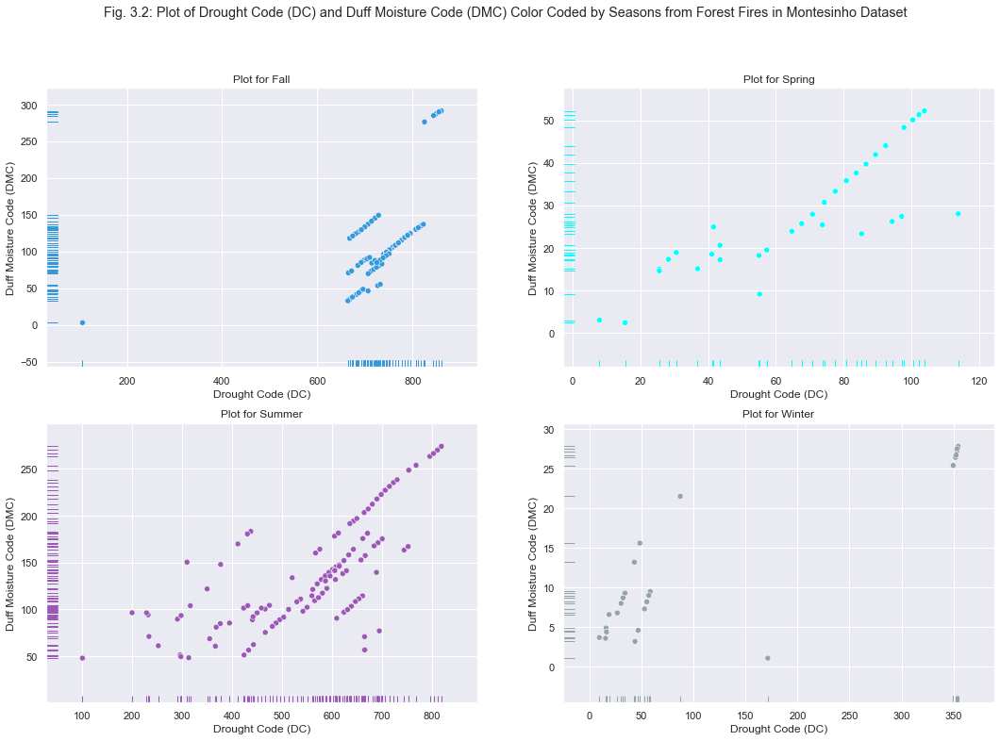

In [47]:
vec_season_vals = df['seasons'].unique().tolist()
vec_season_vals.sort()
val_num_cols = 2
val_num_rows = math.ceil(len(vec_season_vals)/val_num_cols)
#sns.set()
fig,axes = plt.subplots(ncols=val_num_cols,nrows=val_num_rows,figsize=(18,12))
plt.suptitle('Fig. 3.2: Plot of {var_1} and {var_2} Color Coded by {var_3} from Forest Fires in Montesinho Dataset'.format(var_1=get_renamed_variable(var_x_3),
                                                                                                                           var_2=get_renamed_variable(var_y_3),
                                                                                                                           var_3=get_renamed_variable(val_color_by)))
for i,val_i in enumerate(range(0,val_num_cols)):
    for j,val_j in enumerate(range(0,val_num_rows)):
        val_index_loc = val_i*val_num_rows+val_j
        if(val_index_loc<len(vec_columns)):
            val_column_name = vec_columns[val_index_loc]
            sns.scatterplot(data=df.loc[df['seasons']==vec_season_vals[val_index_loc]],x=var_x_3,y=var_y_3,hue=val_color_by,legend=False,palette=dict_palette_seasons,ax=axes[val_i,val_j])
            sns.rugplot(data=df.loc[df['seasons']==vec_season_vals[val_index_loc]],x=var_x_3,y=var_y_3,hue=val_color_by,legend=False,palette=dict_palette_seasons,ax=axes[val_i,val_j])
            axes[val_i,val_j].set(xlabel=get_renamed_variable(var_x_3),ylabel=get_renamed_variable(var_y_3),title='Plot for {var}'.format(var=vec_season_vals[val_index_loc].title()))

In [48]:
df_subset_task3 = df[['DC','DMC','seasons']].copy()
vec_season_corrs = []
vec_season_vals = df_subset_task3['seasons'].unique().tolist()
for i,season in enumerate(vec_season_vals):
    tmp_df = df_subset_task3.loc[df_subset_task3['seasons']==season].copy()
    tmp_df_corr = tmp_df.corr()
    vec_season_corrs.append(tmp_df_corr.loc['DC','DMC'])
df_seasonal_corrs = pd.DataFrame({'season':vec_season_vals,'corr':vec_season_corrs})
print('Average r =',round(df_seasonal_corrs['corr'].mean(),4))
df_seasonal_corrs

Average r = 0.7539


,season,corr
0,Spring,0.883861
1,Fall,0.556989
2,Summer,0.672560
3,Winter,0.902329


## Task #2: Develop a Graphic

[Text(0.5, 0, 'Drought Code (DC)'),
 Text(0, 0.5, 'Duff Moisture Code (DMC)'),
 Text(0.5, 1.0, 'Fig. 3.3: Plot of Drought Code (DC) and Duff Moisture Code (DMC) Color Coded by Seasons from Forest Fires in Montesinho Dataset w/Linear Regressions')]

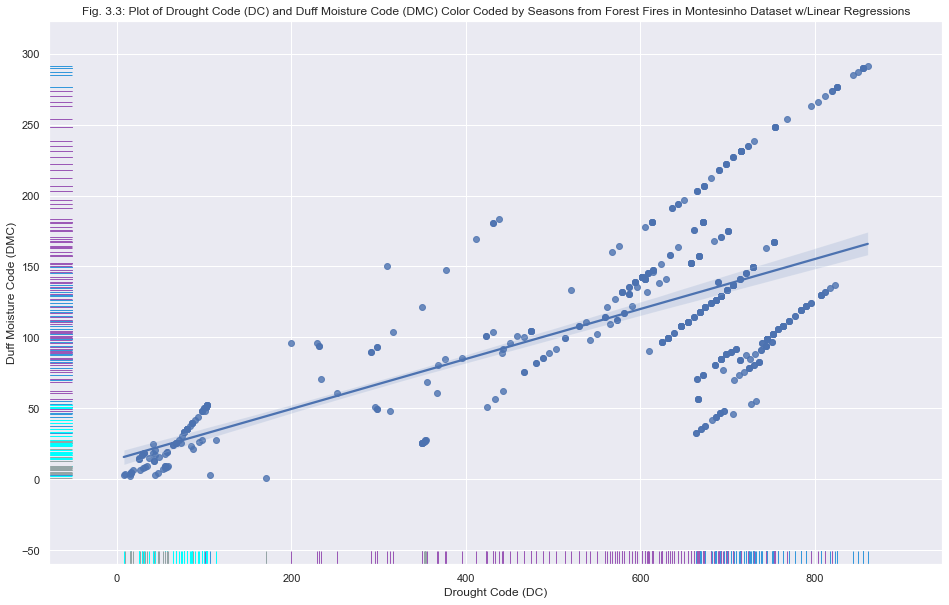

In [49]:
fig,axes = plt.subplots(nrows=1,ncols=1,figsize=(16,10))
sns.regplot(data=df,x=var_x_3,y=var_y_3)
sns.rugplot(data=df,x=var_x_3,y=var_y_3,hue=val_color_by,legend=False,palette=dict_palette_seasons,ax=axes)
axes.set(xlabel=get_renamed_variable(var_x_3),ylabel=get_renamed_variable(var_y_3),
         title='Fig. 3.3: Plot of {var_1} and {var_2} Color Coded by {var_3} from Forest Fires in Montesinho Dataset w/Linear Regressions'.format(var_1=get_renamed_variable(var_x_3),
                                                                                                                             var_2=get_renamed_variable(var_y_3),
                                                                                                                             var_3=get_renamed_variable(val_color_by)))

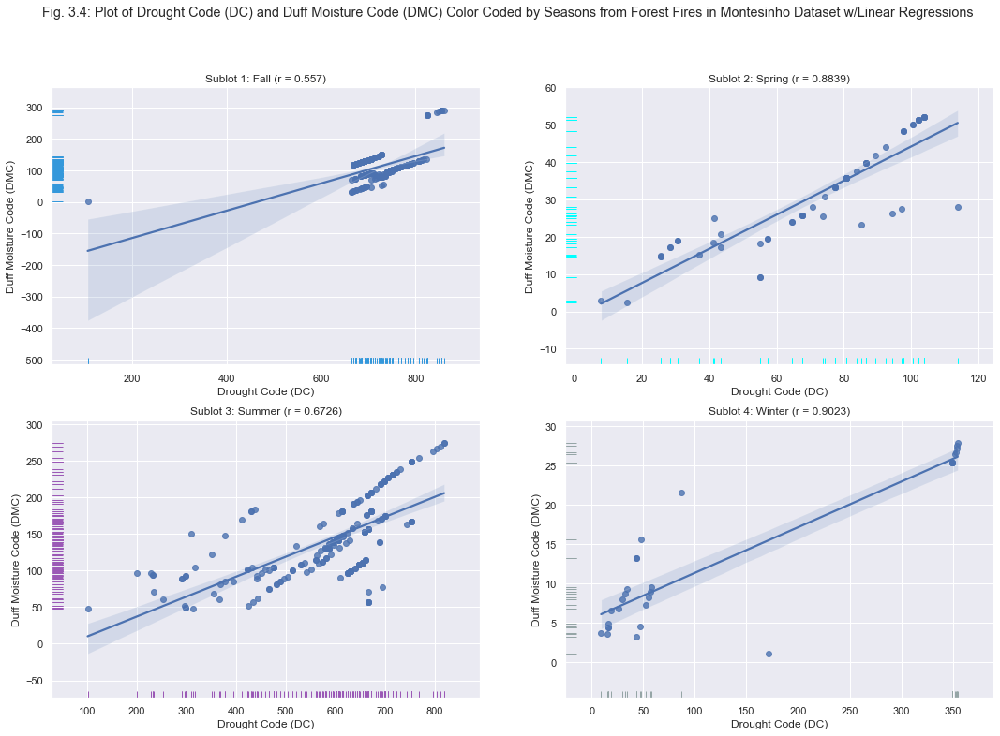

In [50]:
vec_season_vals = df['seasons'].unique().tolist()
vec_season_vals.sort()
val_num_cols = 2
val_num_rows = math.ceil(len(vec_season_vals)/val_num_cols)
#sns.set()
fig,axes = plt.subplots(ncols=val_num_cols,nrows=val_num_rows,figsize=(18,12))
plt.suptitle('Fig. 3.4: Plot of {var_1} and {var_2} Color Coded by {var_3} from Forest Fires in Montesinho Dataset w/Linear Regressions'.format(var_1=get_renamed_variable(var_x_3),
                                                                                                                           var_2=get_renamed_variable(var_y_3),
                                                                                                                           var_3=get_renamed_variable(val_color_by)))
for i,val_i in enumerate(range(0,val_num_cols)):
    for j,val_j in enumerate(range(0,val_num_rows)):
        val_index_loc = val_i*val_num_rows+val_j
        if(val_index_loc<len(vec_columns)):
            val_column_name = vec_columns[val_index_loc]
            val_tmp_r = df_seasonal_corrs.loc[df_seasonal_corrs['season']==vec_season_vals[val_index_loc]]['corr'].values[0]
            sns.regplot(data=df.loc[df['seasons']==vec_season_vals[val_index_loc]],x=var_x_3,y=var_y_3,ax=axes[val_i,val_j])
            sns.rugplot(data=df.loc[df['seasons']==vec_season_vals[val_index_loc]],x=var_x_3,y=var_y_3,hue=val_color_by,legend=False,palette=dict_palette_seasons,ax=axes[val_i,val_j])
            axes[val_i,val_j].set(xlabel=get_renamed_variable(var_x_3),ylabel=get_renamed_variable(var_y_3),
                                  title='Sublot {val_plot}: {var} (r = {r_val})'.format(val_plot=val_index_loc+1,
                                                                                        var=vec_season_vals[val_index_loc].title(),
                                                                                        r_val=round(val_tmp_r,4)))
plt.savefig('./Esposito_Steven_Assmt08.png')

## Task #3: Interpretation of the Graph
Overall, the initial impression that seasons provided a stratified difference between the different linear forms appeared to be reasonable.  However, from Figure 3.4, it is apparent that (1) there appear to be outliers and (2) other latent variables that appear to be effecting the relationship.  The outliers are most obvious in Figure 3.4 during Fall and Winter.  In particular, the Fall (Subplot 1) season is similar to Group III in Anscombe's Quartet.  Winter (Subplot 4) is similar to Group IV in Anscombe's Quartet.  Both of these seasons have outliers that exhibit high leverage points and alter the linear equation.  By comparison, even though Spring (Subplot 2) has a strong correlation `r = 0.8839`), the best fit linear equation does not closely match the data.  This is more pronounced in Summer (Subplot 3).  Although the average value of correlation was improved by developing stratified linear relationships, the overall fit of the linear equation to the data was poor at best.

<div style="text-align: right">1 Apr 2022</div>
<hr>

# Week 9 Assignment (Visualizing Distributions and Part-to-Whole)

Use the dataset and Jupyter Notebook you've been using. 
- Task 1: Develop one question related to distributions or part-to-whole for this dataset. Write the question in a Markdown cell in your notebook.
- Task 2: Develop a graphic appropriate to this type of question, that answers the question. Use a code cell in your notebook.
- Task 3: Write your interpretation of the graph (100 to 500 words), including how it answers the question.
- Task 4: DO NOT SUBMIT YOUR NOTEBOOK FOR THIS. Hover over the graphic in your notebook and you'll see a tiny save icon. Click on that and save the graphic as an image. Upload the image, write your question and answer in the assignment submission box, and submit everything.

## Task #1: Develop a Question

**QUESTION:**
How does the drought code (DC) change by season?  Do any outliers exist?

## Task #2: Develop a Graphic

In [51]:
from matplotlib.patches import Rectangle

In [52]:
val_color_by = 'seasons'

In [53]:
df_pivot_mean_seasons = df.pivot_table(index=val_color_by,values=var_x_3,aggfunc=pd.Series.mean).reset_index()
df_colors = pd.DataFrame.from_dict(dict_palette_seasons,orient='index').reset_index()
df_colors.columns = [val_color_by,'color']
df_season_means = pd.merge(left=df_pivot_mean_seasons,right=df_colors,on=val_color_by)
df_season_means['loc'] = df_season_means['DC']/df_season_means['DC'].max()
df_season_means

,seasons,DC,color,loc
0,Fall,727.051596,#3498db,1.000000
1,Spring,72.698462,cyan,0.099991
2,Summer,589.865236,#9b59b6,0.811311
3,Winter,143.074194,#95a5a6,0.196787


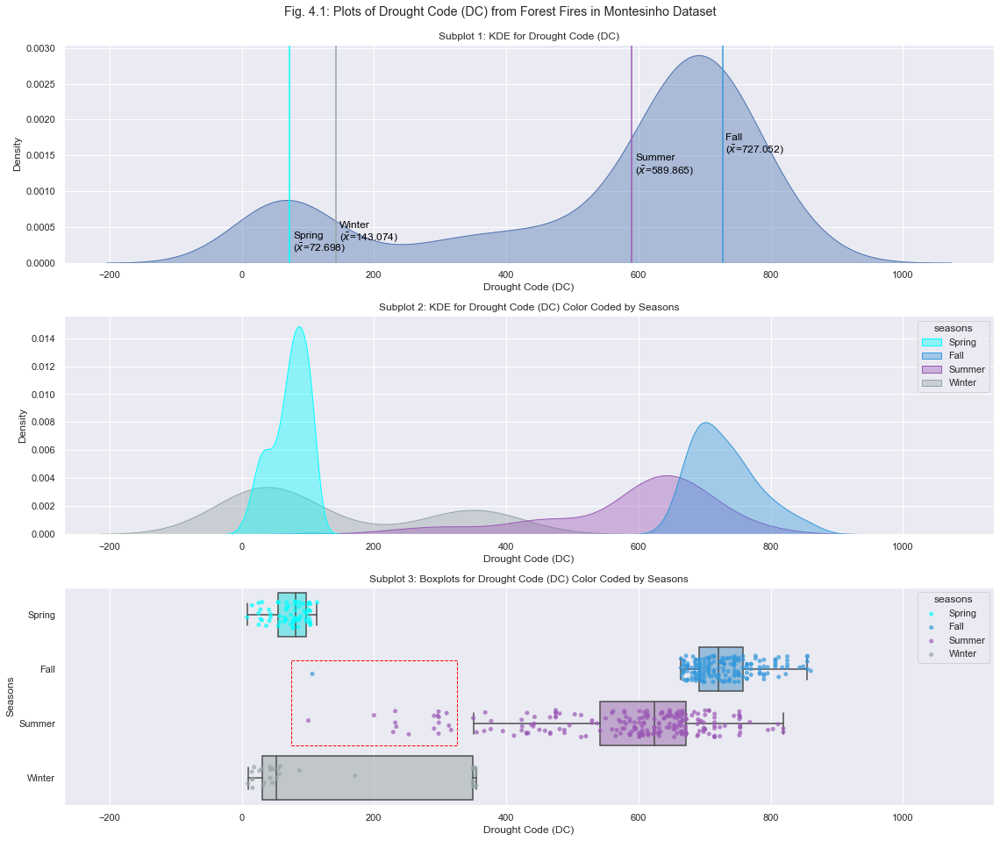

In [54]:
fig,axes = plt.subplots(nrows=3,ncols=1,figsize=(16,14))
plt.suptitle('Fig. 4.1: Plots of {var_1} from Forest Fires in Montesinho Dataset'.format(var_1=get_renamed_variable(var_x_3)),)

var_xmin = -200
var_xmax = 1000
val_plot_axes_id = 0

sns.kdeplot(data=df,x=var_x_3,fill=True,common_norm=False,alpha=0.4,ax=axes[val_plot_axes_id])
axes[val_plot_axes_id].set(xlabel=get_renamed_variable(var_x_3),
                           title='Subplot '+str(val_plot_axes_id+1)+': KDE for {var_1}'.format(var_1=get_renamed_variable(var_x_3)))
var_ymin,var_ymax = axes[val_plot_axes_id].get_ylim()
for i,val in df_season_means.iterrows():
    axes[val_plot_axes_id].axvline(val['DC'],var_ymax,color=val['color'])
    axes[val_plot_axes_id].text(val['DC']+5,val['loc']*(var_ymax-var_ymin)/2,val[val_color_by].title()+'\n'+r'($\bar{x}$='+str(round(val['DC'],3))+')',rotation=0,color='black')
var_xmin,var_xmax = (axes[val_plot_axes_id].get_xlim())

val_plot_axes_id += 1

plt_kde = sns.kdeplot(data=df,x=var_x_3,hue=val_color_by,palette=dict_palette_seasons,fill=True,legend=True,common_norm=False,alpha=0.4,ax=axes[val_plot_axes_id])
axes[val_plot_axes_id].set(xlabel=get_renamed_variable(var_x_3),
                           title='Subplot '+str(val_plot_axes_id+1)+': KDE for {var_1} Color Coded by {var_2}'.format(var_1=get_renamed_variable(var_x_3),
                                                                                                                      var_2=get_renamed_variable(val_color_by)))
axes[val_plot_axes_id].set_xlim(var_xmin,var_xmax)

val_plot_axes_id += 1

sns.boxplot(data=df,x=var_x_3,y=val_color_by,palette=dict_palette_seasons,orient='h',showfliers=False,ax=axes[val_plot_axes_id])
plt_strip = sns.stripplot(x=var_x_3,y=val_color_by,palette=dict_palette_seasons,data=df,marker='o',label='test',jitter=.25,alpha=0.7,ax=axes[val_plot_axes_id])
axes[val_plot_axes_id].set_xlim(var_xmin,var_xmax)
labels = [item.get_text().title() for item in axes[val_plot_axes_id].get_yticklabels()]
axes[val_plot_axes_id].set_yticklabels(labels)
axes[val_plot_axes_id].set(xlabel=get_renamed_variable(var_x_3),
                           ylabel=get_renamed_variable(val_color_by),
                           title='Subplot '+str(val_plot_axes_id+1)+': Boxplots for {var_1} Color Coded by {var_2}'.format(var_1=get_renamed_variable(var_x_3),
                                                                                                                           var_2=get_renamed_variable(val_color_by)))
for patch in axes[val_plot_axes_id].patches:
    r,g,b,a = patch.get_facecolor()
    patch.set_facecolor((r,g,b,.5))
plt_strip_handles,plt_strip_labels = plt_strip.get_legend_handles_labels()
plt_strip_labels = [x.title() for x in df[val_color_by].unique()]
plt_strip.legend(handles=plt_strip_handles,labels=plt_strip_labels,title=val_color_by)
axes[val_plot_axes_id].add_patch(Rectangle((75,0.85),250,1.55,facecolor='none',linestyle='--',ec='red',lw=1))

fig.tight_layout(rect=[0,0.03,1,0.99])
#plt.savefig('./Esposito_Steven_Assmt09.png')

## Task #3: Interpretation of the Graph
Figure 4.1 shows three different perspectives on the distribution of drought code (DC) from the forest fires dataset in Montesinho.  The subplots are all snapped to the same *x-axis* limits, as they all provide a perspective on the distributions, which enabled vertical comparison to occur.  The intention of these graphics is to elucidate: (1) differences in DC across the seasons and (2) discerning outliers in the measures of DC.  Subplot 1 provides a kernel density estimate (KDE) for the overall DC values.  Subplot 1 appears to be bimodal; however, with the means of DC for each season plotted as vertical lines it becomes clearer that the underlying data has many different centers and the underlying data varies by season.  Subplot 2 highlights the nature of each distribution with a KDE color coded by season.  This shows both spring and fall have relatively tight distributions, but winter and summer have large variances.  From Subplot 2 it is also apparent that winter appears to be bimodal, summer has negative skewness, both winter and summer are more platykurtic than spring and fall, and fall has positive skewness.  Subplot 3 shows strip plots overlaying boxplots by season, which makes clear why these patterns emerge:

1. summer has an extensive number of observations outside of the interquartile range (1.5*IQR), surrounded by the red box;
2. winter has a concentration of low values and a concentration of high values, but not many in-between, which elucidates the bimodal nature during winter; and
3. fall has one outlier and a number of larger valued observations, creating the positive skewness.

Combined, these three graphics provide a progression from the whole perspective of DC (Subplot 1) down to the breakdown by seasons (Subplot 2), which can then be further evaluated by looking at the measures of spread and center (Subplot 3).  This enables the questions about how season impacts DC to be addressed with Subplot 2, the outliers question is addressed by Subplot 3, and context is provided by integrating all three.

<div style="text-align: right">5 Apr 2022</div>
<hr>

# Week 10 Assignment (Visualizing Geospatial Data)

Use the dataset and Jupyter Notebook you've been using. 
- Task 1: Task 1: Develop one question related to geospatial aspects of this dataset. Write the question in a Markdown cell in your notebook.
- Task 2: Develop a graphic appropriate to this type of question, that answers the question. Use a code cell in your notebook.
- Task 3: Write your interpretation of the graph (100 to 500 words), including how it answers the question.
- Task 4: DO NOT SUBMIT YOUR NOTEBOOK FOR THIS. Hover over the graphic in your notebook and you'll see a tiny save icon. Click on that and save the graphic as an image. Upload the image, write your question and answer in the assignment submission box, and submit everything.

## Task #1: Develop a Question

**QUESTION:**
Although there is no explicit geospatial data in the Montesinho forest fire dataset, there is a grid over the park implicitly providing a geospatial aspect.  How does the build-up index look during the dry months versus the more damp months (?

## Task #2: Develop a Graphic

In [55]:
import folium
import numpy as np
from matplotlib import colors
from branca.element import Template, MacroElement

In [56]:
df_pivot_bui_all = df.pivot_table(index='Y',columns='X',values='BUI',aggfunc=pd.Series.mean,fill_value=0)
print(df_pivot_bui_all.shape)
df_pivot_bui_all.head()

df_pivot_bui_dry = df.loc[df['seasons'].isin(['Summer','Fall'])].pivot_table(index='Y',columns='X',values='BUI',aggfunc=pd.Series.mean,fill_value=0)
df_pivot_bui_wet = df.loc[df['seasons'].isin(['Winter','Spring'])].pivot_table(index='Y',columns='X',values='BUI',aggfunc=pd.Series.mean,fill_value=0)

(7, 9)


In [57]:
val_opacity = 0.6
dict_palette_bui = {'Low':'lightyellow','Medium':'lightcoral','Elevated':'red','High':'darkred'}
vec_cut_labels = ['Low','Medium','Elevated','High']
vec_cut_vals = [0,np.quantile(df['BUI'],q=0.25),df['BUI'].mean(),np.quantile(df['BUI'],q=0.75),df['BUI'].max()]
vec_label_colors = list(dict_palette_bui.values())

vec_label_vals = []
for i in range(0,len(vec_cut_labels)):
    vec_label_vals.append('''<li><span style='background:'''+vec_label_colors[i]+''';opacity:'''+str(val_opacity)+''';'></span>'''+vec_cut_labels[i].title()+' ('+str(round(vec_cut_vals[i],2))+'-'+str(round(vec_cut_vals[i+1],2))+''')</li>''')

In [58]:
legend_template = '''
{% macro html(this, kwargs) %}

<!doctype html>
<html lang="en">
<head>
  <meta charset="utf-8">
  <meta name="viewport" content="width=device-width, initial-scale=1">
  <title>jQuery UI Draggable - Default functionality</title>
  <link rel="stylesheet" href="//code.jquery.com/ui/1.12.1/themes/base/jquery-ui.css">

  <script src="https://code.jquery.com/jquery-1.12.4.js"></script>
  <script src="https://code.jquery.com/ui/1.12.1/jquery-ui.js"></script>
  
  <script>
  $( function() {
    $( "#maplegend" ).draggable({
                    start: function (event, ui) {
                        $(this).css({
                            right: "auto",
                            top: "auto",
                            bottom: "auto"
                        });
                    }
                });
});

  </script>
</head>
<body>

 
<div id='maplegend' class='maplegend' 
    style='position: absolute; z-index:9999; border:2px solid grey; background-color:rgba(255, 255, 255, 0.8);
     border-radius:6px; padding: 10px; font-size:14px; right: 20px; bottom: 20px;'>
     
<div class='legend-title'>Legend for '''+get_renamed_variable('BUI')+'''</div>
<div class='legend-scale'>
  <ul class='legend-labels'>'''+'\n'.join(vec_label_vals)+'''  </ul>
</div>
</div>
 
</body>
</html>

<style type='text/css'>
  .maplegend .legend-title {
    text-align: left;
    margin-bottom: 5px;
    font-weight: bold;
    font-size: 90%;
    }
  .maplegend .legend-scale ul {
    margin: 0;
    margin-bottom: 5px;
    padding: 0;
    float: left;
    list-style: none;
    }
  .maplegend .legend-scale ul li {
    font-size: 80%;
    list-style: none;
    margin-left: 0;
    line-height: 18px;
    margin-bottom: 2px;
    }
  .maplegend ul.legend-labels li span {
    display: block;
    float: left;
    height: 16px;
    width: 30px;
    margin-right: 5px;
    margin-left: 0;
    border: 1px solid #999;
    }
  .maplegend .legend-source {
    font-size: 80%;
    color: #777;
    clear: both;
    }
  .maplegend a {
    color: #777;
    }
</style>
{% endmacro %}'''

In [59]:
df_pivot_bui = df_pivot_bui_dry.copy()
world_map = folium.Map()

coord_lat_min = 41.72644601730081
coord_lon_min = -7.27334549207857
coord_lat_max = 42.05693991562708
coord_lon_max = -6.50264330267402

world_map = folium.Map(location=[(coord_lat_max+coord_lat_min)/2,(coord_lon_max+coord_lon_min)/2],zoom_start=11.2,tiles='Stamen Toner')
#world_map = folium.Map(tiles='OpenStreetMap')
#folium.TileLayer('Stamen Toner').add_to(world_map)
#folium.TileLayer('Stamen Terrain').add_to(world_map)
#folium.TileLayer('cartodbpositron').add_to(world_map)
#folium.Rectangle([(41.8571080392748,-6.864709958617947),(41.903242151376915,-6.778695242016811)],popup='red',color='#3186cc').add_to(world_map)

world_map.fit_bounds([[coord_lat_min,coord_lon_min],[coord_lat_max,coord_lon_max]])

legend_macro = MacroElement()
legend_macro._template = Template(legend_template)
world_map.get_root().add_child(legend_macro)

world_map.get_root().html.add_child(folium.Element('<center><b>Figure 5.1: Map of {var1} During Dry Periods (Summer, Fall)</b></center>'.format(var1=get_renamed_variable('BUI'))))

vec_lats = np.linspace(start=coord_lat_max,stop=coord_lat_min,num=df_pivot_bui.columns.max()+2)
vec_lons = np.linspace(start=coord_lon_min,stop=coord_lon_max,num=df_pivot_bui.index.max()+2)
for i in range(0,len(vec_lats)-1):
    for j in range(0,len(vec_lons)-1):
        tmp_color = None
        tmp_opacity = 0.0
        tmp_hover = '0.0'
        try:
            tmp_value = df_pivot_bui.loc[i,j]
            tmp_category = pd.cut(x=[tmp_value],bins=vec_cut_vals,labels=vec_cut_labels)[0]
            tmp_color = dict_palette_bui[tmp_category]
            if(tmp_value>0):
                tmp_opacity = val_opacity
            tmp_hover = 'Grid '+str(i)+','+str(j)+'; BUI='+str(round(tmp_value,2))
        except:
            pass
        folium.Rectangle([(vec_lats[i],vec_lons[j]),(vec_lats[i+1],vec_lons[j+1])],opacity=0.25,color='#3186cc',fill_opacity=tmp_opacity,fill_color=tmp_color,popup=tmp_hover).add_to(world_map)
world_map

In [60]:
df_pivot_bui = df_pivot_bui_wet.copy()
world_map = folium.Map()

coord_lat_min = 41.72644601730081
coord_lon_min = -7.27334549207857
coord_lat_max = 42.05693991562708
coord_lon_max = -6.50264330267402

world_map = folium.Map(location=[(coord_lat_max+coord_lat_min)/2,(coord_lon_max+coord_lon_min)/2],zoom_start=11.2,tiles='Stamen Toner')
#world_map = folium.Map(tiles='OpenStreetMap')
#folium.TileLayer('Stamen Toner').add_to(world_map)
#folium.TileLayer('Stamen Terrain').add_to(world_map)
#folium.TileLayer('cartodbpositron').add_to(world_map)
#folium.Rectangle([(41.8571080392748,-6.864709958617947),(41.903242151376915,-6.778695242016811)],popup='red',color='#3186cc').add_to(world_map)

world_map.fit_bounds([[coord_lat_min,coord_lon_min],[coord_lat_max,coord_lon_max]])

legend_macro = MacroElement()
legend_macro._template = Template(legend_template)
world_map.get_root().add_child(legend_macro)

world_map.get_root().html.add_child(folium.Element('<center><b>Figure 5.2: Map of {var1} During Wet Periods (Spring, Winter)</b></center>'.format(var1=get_renamed_variable('BUI'))))

vec_lats = np.linspace(start=coord_lat_max,stop=coord_lat_min,num=df_pivot_bui.columns.max()+2)
vec_lons = np.linspace(start=coord_lon_min,stop=coord_lon_max,num=df_pivot_bui.index.max()+2)
for i in range(0,len(vec_lats)-1):
    for j in range(0,len(vec_lons)-1):
        tmp_color = None
        tmp_opacity = 0.0
        tmp_hover = '0.0'
        try:
            tmp_value = df_pivot_bui.loc[i,j]
            tmp_category = pd.cut(x=[tmp_value],bins=vec_cut_vals,labels=vec_cut_labels)[0]
            tmp_color = dict_palette_bui[tmp_category]
            if(tmp_value>0):
                tmp_opacity = val_opacity
            tmp_hover = 'Grid '+str(i)+','+str(j)+'; BUI='+str(round(tmp_value,2))
        except:
            pass
        folium.Rectangle([(vec_lats[i],vec_lons[j]),(vec_lats[i+1],vec_lons[j+1])],opacity=0.25,color='#3186cc',fill_opacity=tmp_opacity,fill_color=tmp_color,popup=tmp_hover).add_to(world_map)
world_map

(7, 9)


[Text(0.5, 66.5, 'Park Location X-Coordinate'),
 Text(120.5, 0.5, 'Park Location Y-Coordinate'),
 Text(0.5, 1.0, 'Fig. 2.5: Heatmap of the Average Buildup Index (BUI) for Forest Fires in Montesinho Park Grid')]

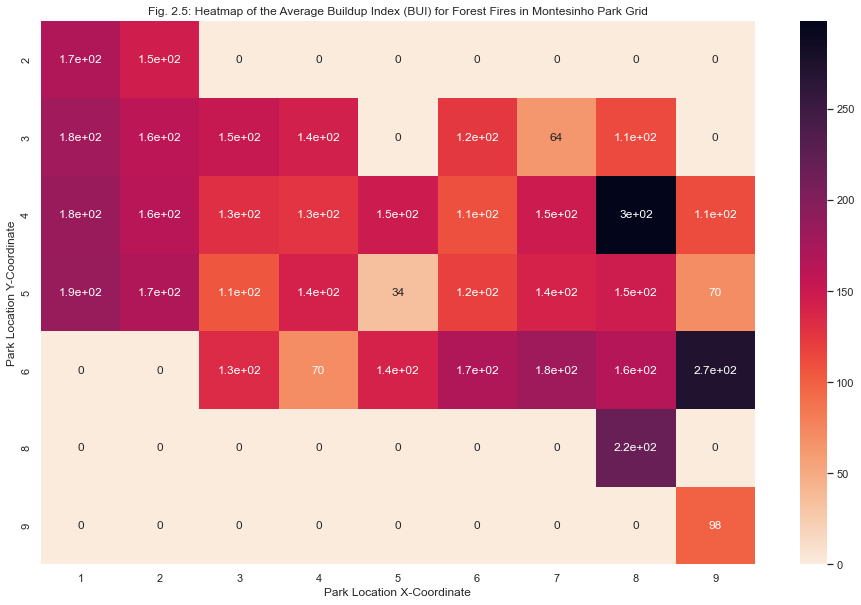

In [61]:
df_pivot_bui = df.pivot_table(index='Y',columns='X',values='BUI',aggfunc=pd.Series.mean,fill_value=0)
print(df_pivot_bui.shape)
df_pivot_bui.sort_index(axis=0,ascending=True,inplace=True)
df_pivot_bui.sort_index(axis=1,ascending=True,inplace=True)

fig,axes = plt.subplots(figsize=(16,10))
sns.heatmap(data=df_pivot_bui,vmin=0,cmap=sns.color_palette("rocket_r",as_cmap=True),annot=True,ax=axes)
axes.set(xlabel=get_renamed_variable('X'),ylabel=get_renamed_variable('Y'),title='Fig. 2.5: Heatmap of the Average Buildup Index (BUI) for Forest Fires in Montesinho Park Grid')

## Task #3: Interpretation of the Graph

Figure 5.1 and Figure 5.2 show a stamen toner map of the Montesinho National Forest in Portugal with a grid overlay from the forest fire dataset.  The grid overlay is from the forest fire dataset, in which the measurements are tied to a grid location with each observation having an *x* and *y* value corresponding to the approximate location in the parl.  This grid was used to create an overlay on the Montesinho National Forest map to explore a heatmap for the mean buildup index.  The buildup index (BUI) is a numeric rating of the total amount of fuel available for combustion.  It is calculated from the Duff moisture code (DMC) and the drought code (DC). The BUI is generally less than twice the DMC value, and moisture in the DMC layer is expected to help prevent burning in material deeper down in the available fuel.  In previous analysis it was observed that there appear to be two major seasons that occur in Montesinho, a wet and a dry season.  As such, the dataset was divided into the dry period (Figure 5.1), consisting of summer and fall, and the wet period (Figure 5.2), consisting of spring and winter.  The average BUI values during these periods were calculated for each grid area, which was then binned into one of four scaled categories consisting of low, medium, elevated, and high BUI values.  The cutoffs for the bins were established using the minimum (0), maximum, 25th and 75th quantiles, and the mean.  Based on the color coding, it becomes clear that the BUI values are extremely low during the wet period (Figure 5.2), and drastically increased during the dry period (Figure 5.1).  This can be seen by the darker red colors in Figure 5.1 compared to the lack of color and light yellow in Figure 5.2, indicating much lower BUI values.  In addition, with the map it becomes clear that the town Braganca has a much larger risk of fire during the dry period, as it is bordered on the north by elevated BUI areas.  Finally, the map includes hover details for each grid, so that a user can explore the values and glean specific information.

<div style="text-align: right">14 Apr 2022</div>
<hr>

# Week 11 Assignment (Visualizing Qualitative Data)

Use the dataset and Jupyter Notebook you've been using. 
- Task 1: Develop one question related to distributions or part-to-whole for this dataset. Write the question in a Markdown cell in your notebook.
- Task 2: Develop a graphic appropriate to this type of question, that answers the question. Use a code cell in your notebook.
- Task 3: Write your interpretation of the graph (100 to 500 words), including how it answers the question.
- Task 4: DO NOT SUBMIT YOUR NOTEBOOK FOR THIS. Hover over the graphic in your notebook and you'll see a tiny save icon. Click on that and save the graphic as an image. Upload the image, write your question and answer in the assignment submission box, and submit everything.

This effort was abandoned, as it was deemed not to be qualitative.

In [62]:
import pandas as pd
import numpy as np

import holoviews as hv
import plotly.graph_objects as go
import plotly.express as pex

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
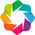

In [63]:
hv.extension('bokeh')

In [64]:
df_grouped = df.pivot_table(index=['month','day'],values='X',aggfunc=len).reset_index()
df_grouped.head()

,month,day,X
0,apr,fri,1
1,apr,mon,1
2,apr,sat,1
3,apr,sun,3
4,apr,thu,2


In [65]:
viz_sankey = hv.Sankey(df_grouped)
viz_sankey.opts(cmap='Colorblind',label_position='left',edge_color='month',edge_line_width=0,
                 node_alpha=1.0,node_width=40,node_sort=True,width=1000,height=600,bgcolor="snow",
                 title='Dry Months and Days On/Near Weekend (Fri, Sat, Sun, Mon) have Most Forest Fires')

:Sankey   [month,day]   (X)